# Package Insatallation

In [1]:
from utils.dataloader import DatasetLoader
from utils.plot import plt_corr,plot_index

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import shap
import pandas as pd
import xgboost as xgb

from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split , cross_val_score, GridSearchCV
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler

from keras.models import Model,Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.optimizers import SGD, Adam, RMSprop
from keras.regularizers import L2

import sage

import warnings
warnings.filterwarnings('ignore')

# Dataset Loader

In [2]:
dataset_path = "data/dataset/"
loader = DatasetLoader(dataset_path)

datasets = loader.load_all_pickle_dataset()
dataset_dict = loader.get_state_names(datasets[0])
print(dataset_dict)

{'alabama': ['baldwin', 'calhoun', 'cherokee', 'coffee', 'covington', 'dale', 'dallas', 'elmore', 'escambia', 'geneva', 'henry', 'houston', 'lauderdale', 'lawrence', 'limestone', 'madison', 'mobile', 'monroe', 'shelby'], 'arizona': ['graham', 'maricopa', 'pinal', 'yuma'], 'arkansas': ['ashley', 'chicot', 'clay', 'craighead', 'crittenden', 'desha', 'drew', 'jefferson', 'lee', 'lincoln', 'mississippi', 'phillips', 'poinsett'], 'california': ['kings', 'merced', 'tulare'], 'georgia': ['appling', 'atkinson', 'baker', 'ben hill', 'berrien', 'bleckley', 'brooks', 'bulloch', 'burke', 'calhoun', 'candler', 'coffee', 'colquitt', 'cook', 'crisp', 'decatur', 'dodge', 'dooly', 'early', 'emanuel', 'grady', 'irwin', 'jeff davis', 'jefferson', 'jenkins', 'laurens', 'miller', 'mitchell', 'pierce', 'pulaski', 'randolph', 'screven', 'seminole', 'sumter', 'tattnall', 'terrell', 'thomas', 'tift', 'turner', 'webster', 'wilcox', 'worth'], 'kansas': ['pratt', 'sumner'], 'louisiana': ['catahoula', 'east carrol

In [3]:
blacklist_states = ['kansas', 'new mexico', 'california', 'arizona']

for idx in range(len(blacklist_states)):
    del dataset_dict[blacklist_states[idx]]
    
city_count = sum(len(cities) for cities in dataset_dict.values())
print("Total number of cities:", city_count)

Total number of cities: 224


# Case 1 - 15th Day

In [5]:
full_df = loader.combine_datasets(datasets,dataset_dict,total_dataset_number=5, selected_day=15)

In [6]:
full_df

,Date,evi,lai,fpar,lst_day,lst_nigth,dayl,prcp,srad,tmax,...,Clay,Bulk density,Coarse fragments,Total Nitrogen,pH,CEC,SOC,OCD,OCS,yield
0,04-15,0.310849,11.546470,45.162013,15083.440266,14397.592538,45896.016658,0.319848,427.239497,27.437770,...,241.478909,218.091482,92.958904,52.015565,2617.824646,145.563338,4.973312,131.016430,38.137413,906.0
1,05-15,0.328404,12.507246,44.811690,15171.300404,14576.705072,48760.840971,4.875159,387.576621,29.670406,...,241.478909,218.091482,92.958904,52.015565,2617.824646,145.563338,4.973312,131.016430,38.137413,906.0
2,06-15,0.186835,12.136800,44.564538,15101.516064,14620.126352,50272.138924,11.172403,310.082462,29.770382,...,241.478909,218.091482,92.958904,52.015565,2617.824646,145.563338,4.973312,131.016430,38.137413,906.0
3,07-15,0.337602,11.587949,40.694987,15105.019305,14636.127627,49658.408145,7.419759,328.322165,31.307629,...,241.478909,218.091482,92.958904,52.015565,2617.824646,145.563338,4.973312,131.016430,38.137413,906.0
4,08-15,0.429020,23.179714,66.186181,15012.753248,14827.422734,47196.632539,8.091435,349.853724,33.159170,...,241.478909,218.091482,92.958904,52.015565,2617.824646,145.563338,4.973312,131.016430,38.137413,906.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6595,05-15,0.147366,3.009667,16.458302,15785.532374,14406.485629,49448.332171,0.000000,511.273044,32.359206,...,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069,410.0
6596,06-15,0.138030,2.773413,15.413657,15917.574843,14614.328619,51060.650087,0.759882,497.074180,33.964788,...,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069,410.0
6597,07-15,0.158512,3.184097,17.261705,16086.444367,14851.301994,50300.061961,0.000000,507.819244,39.806442,...,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069,410.0
6598,08-15,0.155171,4.577355,24.006862,15970.488128,14730.365684,47515.327461,0.441983,474.409474,36.650876,...,145.947609,185.418075,109.261333,77.933179,556.218997,56.119027,33.153465,92.948824,21.344069,410.0


### Feature Removing

In [7]:
"""
Removing Features:
Static: OCS, Bulk density, CEC
Dynamic: lst_day, lst_night, fpar, tmin, vp, lai
"""

'Total Nitrogen'

drop_feature_list = ['OCS', 'Bulk density', 'CEC' ,'lst_day', 'lst_nigth', 'fpar', 'tmin', 'vp', 'lai']
df_dropped = full_df.drop(drop_feature_list,axis=1)

In [8]:
df_dropped

,Date,evi,dayl,prcp,srad,tmax,ssm,susm,Sand,Silt,Clay,Coarse fragments,Total Nitrogen,pH,SOC,OCD,yield
0,04-15,0.310849,45896.016658,0.319848,427.239497,27.437770,9.549332,34.738435,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,4.973312,131.016430,906.0
1,05-15,0.328404,48760.840971,4.875159,387.576621,29.670406,10.881194,37.243128,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,4.973312,131.016430,906.0
2,06-15,0.186835,50272.138924,11.172403,310.082462,29.770382,20.549777,71.591904,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,4.973312,131.016430,906.0
3,07-15,0.337602,49658.408145,7.419759,328.322165,31.307629,23.051313,83.270080,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,4.973312,131.016430,906.0
4,08-15,0.429020,47196.632539,8.091435,349.853724,33.159170,24.194533,93.193471,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,4.973312,131.016430,906.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6595,05-15,0.147366,49448.332171,0.000000,511.273044,32.359206,2.313060,8.493533,158.948581,668.634026,145.947609,109.261333,77.933179,556.218997,33.153465,92.948824,410.0
6596,06-15,0.138030,51060.650087,0.759882,497.074180,33.964788,2.206431,8.041070,158.948581,668.634026,145.947609,109.261333,77.933179,556.218997,33.153465,92.948824,410.0
6597,07-15,0.158512,50300.061961,0.000000,507.819244,39.806442,2.144471,7.708455,158.948581,668.634026,145.947609,109.261333,77.933179,556.218997,33.153465,92.948824,410.0
6598,08-15,0.155171,47515.327461,0.441983,474.409474,36.650876,2.332524,8.612518,158.948581,668.634026,145.947609,109.261333,77.933179,556.218997,33.153465,92.948824,410.0


In [9]:
vector_df_15, _ = loader.vectorize_dataset(df_dropped)

In [10]:
vector_df_15.dtypes

evi_4    float64
evi_5    float64
evi_6    float64
evi_7    float64
evi_8    float64
          ...   
pH_9     float64
pH       float64
SOC      float64
OCD      float64
yield    float64
Length: 82, dtype: object

In [11]:
vector_df_15

,evi_4,evi_5,evi_6,evi_7,evi_8,evi_9,dayl_4,dayl_5,dayl_6,dayl_7,...,pH_4,pH_5,pH_6,pH_7,pH_8,pH_9,pH,SOC,OCD,yield
0,0.310849,45896.016658,0.319848,427.239497,27.437770,9.549332,34.738435,154.599236,539.340720,241.478909,...,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,2617.824646,4.973312,131.016430,906.0
1,0.336559,46254.087089,0.221124,445.857697,28.149444,17.429897,95.798961,154.125211,308.963687,393.967130,...,154.125211,308.963687,393.967130,100.792664,53.429210,1064.655667,1064.655667,58.750118,153.173881,983.0
2,0.336853,46295.602571,0.621514,435.435894,28.558294,19.550295,97.355930,150.862889,273.146413,410.812365,...,150.862889,273.146413,410.812365,109.764601,52.214165,1067.024366,1067.024366,38.610076,150.685079,964.0
3,0.360703,45978.737251,0.000000,445.037145,28.957153,6.257261,28.802221,160.232886,663.365493,130.701087,...,160.232886,663.365493,130.701087,59.933976,54.598065,859.944129,859.944129,21.015287,140.017393,800.0
4,0.380783,45973.194882,0.043116,453.083244,28.941340,6.849353,36.950674,157.265212,644.284111,159.153368,...,157.265212,644.284111,159.153368,77.696829,51.155335,969.720436,969.720436,16.696927,130.917712,857.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.267679,45855.301590,0.656756,500.111425,24.327627,12.064790,68.587668,175.779677,178.360079,392.798638,...,175.779677,178.360079,392.798638,267.768370,68.298912,1214.751463,1214.751463,3.542135,184.377850,1007.0
1096,0.261453,46427.393221,0.343266,454.650865,16.914865,10.796414,51.412224,168.588090,295.737775,400.648040,...,168.588090,295.737775,400.648040,177.292773,74.770346,1014.992316,1014.992316,30.698133,131.214816,483.0
1097,0.174508,45558.536441,0.076448,465.490105,27.764946,6.419748,26.413288,165.075644,546.275191,179.360253,...,165.075644,546.275191,179.360253,176.403242,76.559601,1005.625344,1005.625344,5.454114,132.518912,701.0
1098,0.256204,46010.429597,0.453012,491.050232,21.158996,17.650627,153.085437,175.741669,130.928545,464.448651,...,175.741669,130.928545,464.448651,373.127370,76.310138,1036.009102,1036.009102,28.895865,166.142748,588.0


## Train Test Split

In [70]:
nan_check = vector_df_15.isna().any()
# nan_check will be a Series indicating which columns contain NaN values
count_nan_columns = nan_check.sum()
print(f"Number of columns with NaN values: {count_nan_columns}")

Number of columns with NaN values: 0


In [12]:
target = 'yield'

train = vector_df_15.drop(target,axis=1).to_numpy()
test = vector_df_15[target].to_numpy()

X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(train, test, test_size=0.20, random_state=34)

scaler_X = MinMaxScaler()
scaler_X.fit(X_train_full)
X_train_scaled = scaler_X.transform(X_train_full)
X_test_scaled = scaler_X.transform(X_test_full)

scaler_Y = MinMaxScaler()
scaler_Y.fit(y_train_full.reshape(-1, 1))
y_train_scaled = scaler_Y.transform(y_train_full.reshape(-1, 1))
y_test_scaled = scaler_Y.transform(y_test_full.reshape(-1, 1))
test_scaled = scaler_Y.transform(test.reshape(-1, 1))



print("Train: ", X_train_scaled.shape)
print("Test: ", X_test_scaled.shape)


print("Train: ", y_train_scaled.shape)
print("Test: ", y_test_scaled.shape)



Train:  (880, 81)
Test:  (220, 81)
Train:  (880, 1)
Test:  (220, 1)


## LSTM

"""
LSTM_full = Sequential()
LSTM_full.add(LSTM(32, activation='tanh',  return_sequences=True, input_shape=(X_train_full.shape[1],1))) #kernel_regularizer=L2(0.01)
LSTM_full.add(LSTM(8, activation='tanh', return_sequences=False))
LSTM_full.add(Dense(1))

optimizer = Adam(lr=0.001)
LSTM_full.compile(optimizer=optimizer, loss='mse')

history_full_lstm = LSTM_full.fit(X_train_scaled, y_train_scaled, epochs=250, batch_size=16,validation_split=0.2)


Training Set R-Square= 0.6376360911124004
Test Set R-Square= 0.5214782869496455
"""

"""LSTM_full = Sequential()
LSTM_full.add(LSTM(32, activation='tanh',   input_shape=(X_train_full.shape[1],1))) #kernel_regularizer=L2(0.01)
#LSTM_full.add(LSTM(8, activation='tanh', return_sequences=False))
LSTM_full.add(Dense(1))

optimizer = Adam(lr=0.001)
LSTM_full.compile(optimizer=optimizer, loss='mse')

history_full_lstm = LSTM_full.fit(X_train_scaled, y_train_scaled, epochs=400, batch_size=16,validation_split=0.2)
Training Set R-Square= 0.7723921883039004
Test Set R-Square= 0.5821219270887769

"""

"""LSTM_full = Sequential()
LSTM_full.add(LSTM(32, activation='tanh',   input_shape=(X_train_full.shape[1],1))) #kernel_regularizer=L2(0.01)
#LSTM_full.add(LSTM(8, activation='tanh', return_sequences=False))
LSTM_full.add(Dense(1))

optimizer = Adam(lr=0.001)
LSTM_full.compile(optimizer=optimizer, loss='mse')

history_full_lstm = LSTM_full.fit(X_train_scaled, y_train_scaled, epochs=350, batch_size=4,validation_split=0.2)
Training Set R-Square= 0.8439527325115375
Test Set R-Square= 0.6460619816949699

"""

"""LSTM_full = Sequential()
LSTM_full.add(LSTM(32, activation='tanh',   input_shape=(X_train_full.shape[1],1))) #kernel_regularizer=L2(0.01)
#LSTM_full.add(LSTM(8, activation='tanh', return_sequences=False))
LSTM_full.add(Dense(1))

optimizer = Adam(lr=0.001)
LSTM_full.compile(optimizer=optimizer, loss='mse')

history_full_lstm = LSTM_full.fit(X_train_scaled, y_train_scaled, epochs=340, batch_size=4,validation_split=0.2)
Training Set R-Square= 0.7932879488513006
Test Set R-Square= 0.6493998808898699
RMSE: 0.094679

"""

In [125]:
from tensorflow_addons.metrics import RSquare

clear_session()

LSTM_full = Sequential()
LSTM_full.add(LSTM(64, activation='tanh',input_shape=(X_train_full.shape[1],1))) #kernel_regularizer=L2(0.01)
#LSTM_full.add(LSTM(8, activation='tanh', return_sequences=False))
LSTM_full.add(Dense(1))

optimizer = Adam(lr=0.0009669250179396106)
LSTM_full.compile(optimizer=optimizer, loss='mse',metrics=[RSquare()])

history_full_lstm = LSTM_full.fit(X_train_scaled, y_train_scaled, epochs=300, batch_size=8)
#l2 sonradan eklendi aşağıdaki training l2siz

Epoch 1/300
110/110 [==============================] - 3s 14ms/step - loss: 0.0344 - r_square: -0.5311
Epoch 2/300
110/110 [==============================] - 1s 12ms/step - loss: 0.0241 - r_square: -0.0715
Epoch 3/300
110/110 [==============================] - 1s 12ms/step - loss: 0.0233 - r_square: -0.0356
Epoch 4/300
110/110 [==============================] - 1s 13ms/step - loss: 0.0234 - r_square: -0.0411
Epoch 5/300
110/110 [==============================] - 1s 12ms/step - loss: 0.0224 - r_square: 0.0031
Epoch 6/300
110/110 [==============================] - 1s 12ms/step - loss: 0.0219 - r_square: 0.0234
Epoch 7/300
110/110 [==============================] - 1s 12ms/step - loss: 0.0216 - r_square: 0.0387
Epoch 8/300
110/110 [==============================] - 1s 12ms/step - loss: 0.0208 - r_square: 0.0736
Epoch 9/300
110/110 [==============================] - 1s 12ms/step - loss: 0.0203 - r_square: 0.0960
Epoch 10/300
110/110 [==============================] - 1s 12ms/step - loss: 0

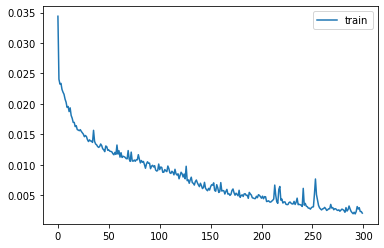

KeyError: 'val_loss'

In [134]:
plt.plot(history_full_lstm.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/loss.png")
plt.show()

plt.plot(history_full_lstm.history['val_loss'], label='val')
plt.legend()
#plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/val_loss.png")
plt.show()

In [127]:
score = LSTM_full.evaluate(X_test_scaled, y_test_scaled, batch_size=1)


220/220 [==============================] - 1s 2ms/step - loss: 0.0082 - r_square: 0.6787


In [128]:
score

[0.008215690962970257, 0.6786706447601318]

In [129]:
pred_lstm_full = LSTM_full.predict(X_test_scaled) 
pred_train_lstm_full = LSTM_full.predict(X_train_scaled)

28/28 [==============================] - 0s 6ms/step


In [130]:
print(pred_train_lstm_full.shape)
print(pred_lstm_full.shape)
print(y_test_scaled.shape)

(880, 1)
(220, 1)
(220, 1)


In [131]:
rmse_lstm_full = np.sqrt(mean_squared_error(y_test_scaled, pred_lstm_full)) 
print("RMSE: %f" % (rmse_lstm_full)) 


RMSE: 0.090640


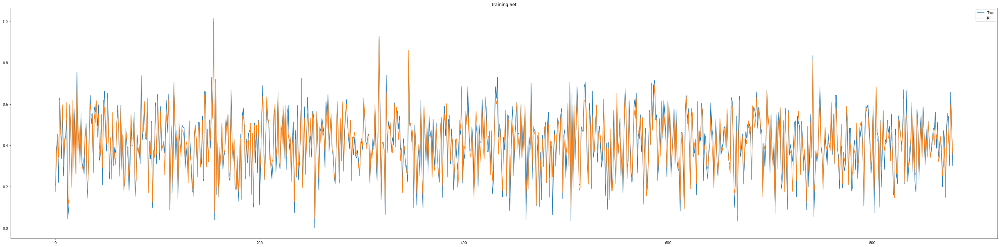

Training Set R-Square= 0.9120374432015368


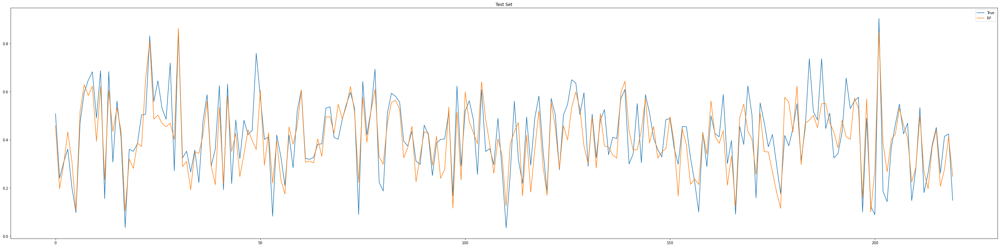

Test Set R-Square= 0.6786701954810523


In [133]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/training.png")

plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_scaled ,pred_train_lstm_full)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/test.png")

plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_scaled,pred_lstm_full)
print("Test Set R-Square=", rf_indices_r2_test)

NameError: name 'pred_lstm_full' is not defined

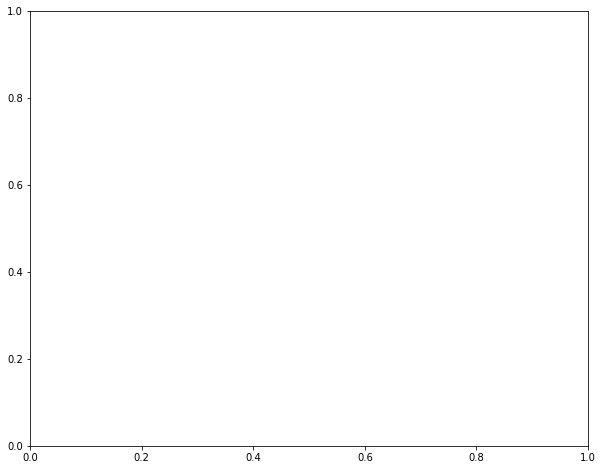

In [34]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled, pred_lstm_full)
ax.plot([test_scaled.min(), test_scaled.max()], [test_scaled.min(), test_scaled.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled, pred_lstm_full)), (0.1, 0),fontsize=20, fontweight='bold')
#plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/lstm/r2.png")

plt.show()


## Optuna LSTM

In [21]:
import optuna
from tensorflow_addons.metrics import RSquare
from keras.backend import clear_session


def lstm_optuna(trial):
    clear_session()

    input_shape=(X_train_full.shape[1],1)
    #optimizer = Adam(lr=0.001)

    model = Sequential()
    # 2. Suggest values of the hyperparameters using a trial object.
    model.add(
        LSTM(units=trial.suggest_categorical('units', [16 ,32, 64, 128]), 
            activation='tanh',
            input_shape=input_shape))
    model.add(Dense(1))

    # We compile our model with a sampled learning rate.
    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=[RSquare()])
    
    model.fit(X_train_scaled, y_train_scaled, epochs=trial.suggest_int('epochs',250,450,10), batch_size=4, verbose=False)
    score = model.evaluate(X_test_scaled, y_test_scaled, batch_size=1,verbose=0)

    return score[1]



In [66]:
study_lstm = optuna.create_study(direction="maximize")
study_lstm.optimize(lstm_optuna, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm.trials)))

print("Best trial:")
trial = study_lstm.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

[I 2023-10-29 02:07:18,645] A new study created in memory with name: no-name-2bc689c2-2ce9-4b4a-9168-80b989dd234d


[I 2023-10-29 02:11:58,138] Trial 0 finished with value: 0.4168304204940796 and parameters: {'units': 32, 'lr': 0.00020013758156185688, 'epochs': 260}. Best is trial 0 with value: 0.4168304204940796.
[I 2023-10-29 02:17:12,662] Trial 1 finished with value: 0.4527415633201599 and parameters: {'units': 32, 'lr': 0.000338063469906588, 'epochs': 300}. Best is trial 1 with value: 0.4527415633201599.
[I 2023-10-29 02:24:31,076] Trial 2 finished with value: 0.6032129526138306 and parameters: {'units': 32, 'lr': 0.0008177578779409268, 'epochs': 420}. Best is trial 2 with value: 0.6032129526138306.
[I 2023-10-29 02:29:43,400] Trial 3 finished with value: 0.560366153717041 and parameters: {'units': 16, 'lr': 0.0007383620977659289, 'epochs': 320}. Best is trial 2 with value: 0.6032129526138306.
[I 2023-10-29 02:39:51,245] Trial 4 finished with value: 0.47919297218322754 and parameters: {'units': 64, 'lr': 0.00011366579248516677, 'epochs': 440}. Best is trial 2 with value: 0.6032129526138306.
[I 2

Number of finished trials: 50
Best trial:
  Value: 0.7041152715682983
  Params: 
    units: 64
    lr: 0.0009669250179396106
    epochs: 300


[I 2023-10-27 19:26:16,883] A new study created in memory with name: no-name-dbd30364-495b-4a89-b2ec-ed4afbd1d65c
[I 2023-10-27 19:34:07,004] Trial 0 finished with value: 0.47689276933670044 and parameters: {'units': 16, 'lr': 0.0004360324315383192, 'epochs': 420}. Best is trial 0 with value: 0.47689276933670044.
[I 2023-10-27 19:39:53,168] Trial 1 finished with value: 0.20388633012771606 and parameters: {'units': 16, 'lr': 0.0003209121076080061, 'epochs': 335}. Best is trial 0 with value: 0.47689276933670044.
[I 2023-10-27 19:50:56,095] Trial 2 finished with value: 0.631399393081665 and parameters: {'units': 64, 'lr': 0.0007166052300018219, 'epochs': 440}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:02:11,421] Trial 3 finished with value: 0.5056438446044922 and parameters: {'units': 64, 'lr': 0.00018464565235248772, 'epochs': 430}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:07:50,710] Trial 4 finished with value: 0.46766066551208496 and parameters: {'units': 32, 'lr': 0.0002723750922359385, 'epochs': 320}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:18:15,290] Trial 5 finished with value: 0.5759878158569336 and parameters: {'units': 64, 'lr': 0.0009262419303186195, 'epochs': 440}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:25:11,840] Trial 6 finished with value: 0.4780105948448181 and parameters: {'units': 32, 'lr': 0.00039055320977489415, 'epochs': 400}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:32:07,181] Trial 7 finished with value: 0.5493099689483643 and parameters: {'units': 32, 'lr': 0.0007981850129969682, 'epochs': 355}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:38:21,698] Trial 8 finished with value: 0.17087018489837646 and parameters: {'units': 16, 'lr': 0.00017495881668354833, 'epochs': 350}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:49:26,083] Trial 9 finished with value: 0.5824609398841858 and parameters: {'units': 64, 'lr': 0.0007671684344687467, 'epochs': 450}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 20:58:15,196] Trial 10 finished with value: 0.4139549732208252 and parameters: {'units': 64, 'lr': 0.00010430434445662579, 'epochs': 390}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 21:08:11,185] Trial 11 finished with value: 0.5664758682250977 and parameters: {'units': 64, 'lr': 0.0006366814416151655, 'epochs': 450}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 21:22:09,302] Trial 12 finished with value: 0.5605716705322266 and parameters: {'units': 64, 'lr': 0.0005890842051451438, 'epochs': 415}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 21:33:00,547] Trial 13 finished with value: 0.6090561747550964 and parameters: {'units': 64, 'lr': 0.0009675364695543397, 'epochs': 450}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 21:40:02,643] Trial 14 finished with value: 0.5733736753463745 and parameters: {'units': 64, 'lr': 0.0009702059815358757, 'epochs': 300}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 21:48:11,009] Trial 15 finished with value: 0.6306540966033936 and parameters: {'units': 64, 'lr': 0.00061247466321676, 'epochs': 380}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 21:56:15,253] Trial 16 finished with value: 0.35384273529052734 and parameters: {'units': 64, 'lr': 0.0005054871076386676, 'epochs': 370}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 22:04:43,555] Trial 17 finished with value: 0.6169073581695557 and parameters: {'units': 64, 'lr': 0.0006200211617041101, 'epochs': 385}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 22:11:58,183] Trial 18 finished with value: 0.5460313558578491 and parameters: {'units': 32, 'lr': 0.0007162389910096795, 'epochs': 410}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 22:17:58,531] Trial 19 finished with value: 0.2742776870727539 and parameters: {'units': 16, 'lr': 0.0005056891985386242, 'epochs': 365}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 22:27:13,800] Trial 20 finished with value: 0.5210174322128296 and parameters: {'units': 64, 'lr': 0.0005329976589995229, 'epochs': 385}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 22:35:58,083] Trial 21 finished with value: 0.5655031204223633 and parameters: {'units': 64, 'lr': 0.0006323163367101144, 'epochs': 380}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 22:45:00,851] Trial 22 finished with value: 0.6278963088989258 and parameters: {'units': 64, 'lr': 0.0007281219543406093, 'epochs': 395}. Best is trial 2 with value: 0.631399393081665.
[I 2023-10-27 22:54:11,197] Trial 23 finished with value: 0.6597414016723633 and parameters: {'units': 64, 'lr': 0.0007687843222019843, 'epochs': 400}. Best is trial 23 with value: 0.6597414016723633.
[I 2023-10-27 23:03:35,035] Trial 24 finished with value: 0.6294427514076233 and parameters: {'units': 64, 'lr': 0.0008314893824570247, 'epochs': 400}. Best is trial 23 with value: 0.6597414016723633.
[I 2023-10-27 23:14:44,783] Trial 25 finished with value: 0.5136460065841675 and parameters: {'units': 64, 'lr': 0.0007602976748292576, 'epochs': 425}. Best is trial 23 with value: 0.6597414016723633.


## MLP

In [ ]:
MLP_full.summary()

In [28]:
X_train_scaled.shape

(880, 81)

In [140]:
from tensorflow.keras.optimizers.legacy import Adam 
from keras.models import Model,Sequential
from keras.layers import Dense, Flatten
from sklearn.metrics import r2_score
from keras.layers import Dropout

MLP_full = Sequential()
MLP_full.add(Dense(128, activation="relu", input_shape=(X_train_scaled.shape[1],1)))
MLP_full.add(Dense(32, activation="relu"))
MLP_full.add(Dense(4, activation="relu"))
MLP_full.add(Flatten())
MLP_full.add(Dense(1))

MLP_full.compile(loss='mse', optimizer=Adam(lr=0.0003212830798480625), metrics=[RSquare()])#,decay=1e-3 / 200))

history_MLP_full = MLP_full.fit(X_train_scaled, y_train_scaled, epochs=210, batch_size=4)


Epoch 1/210
220/220 [==============================] - 1s 1ms/step - loss: 0.0485 - r_square: -1.1598
Epoch 2/210
220/220 [==============================] - 0s 2ms/step - loss: 0.0186 - r_square: 0.1740
Epoch 3/210
220/220 [==============================] - 0s 1ms/step - loss: 0.0155 - r_square: 0.3088
Epoch 4/210
220/220 [==============================] - 0s 1ms/step - loss: 0.0154 - r_square: 0.3154
Epoch 5/210
220/220 [==============================] - 0s 2ms/step - loss: 0.0143 - r_square: 0.3643
Epoch 6/210
220/220 [==============================] - 0s 1ms/step - loss: 0.0139 - r_square: 0.3819
Epoch 7/210
220/220 [==============================] - 0s 1ms/step - loss: 0.0132 - r_square: 0.4121
Epoch 8/210
220/220 [==============================] - 1s 2ms/step - loss: 0.0128 - r_square: 0.4311
Epoch 9/210
220/220 [==============================] - 0s 1ms/step - loss: 0.0124 - r_square: 0.4482
Epoch 10/210
220/220 [==============================] - 0s 1ms/step - loss: 0.0117 - r_squ

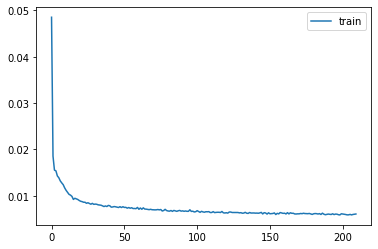

In [153]:
plt.plot(history_MLP_full.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/loss.png")
plt.show()

In [143]:
pred_train_mlp_full = MLP_full.predict(X_train_scaled)
pred_test_mlp_full = MLP_full.predict(X_test_scaled)

7/7 [==============================] - 0s 2ms/step


In [144]:
X_test_scaled.shape

(220, 81)

In [145]:
rmse_mlp_full = np.sqrt(mean_squared_error(y_test_scaled, pred_test_mlp_full)) 
print("RMSE: %f" % (rmse_mlp_full)) 

RMSE: 0.094500


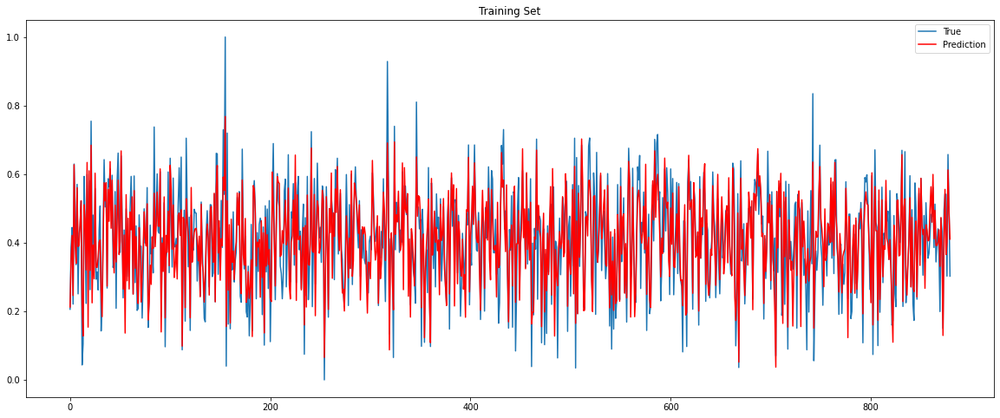

Training Set R-Square= 0.75118658613989


In [154]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_scaled))
plt.plot(pred_train_mlp_full,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/train.png")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_scaled,pred_train_mlp_full)
print("Training Set R-Square=", mlp_indices_r2_train)

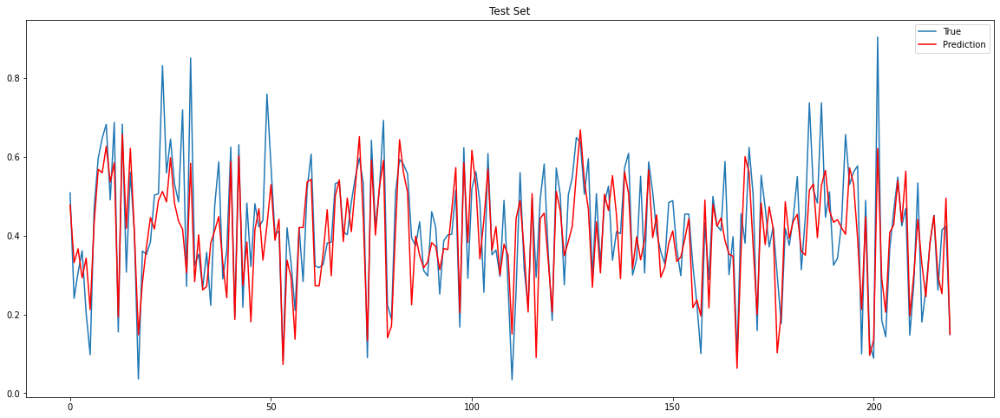

Test Set R-Square= 0.6507230342322566


In [155]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_scaled))
plt.plot(pred_test_mlp_full,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/test.png")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_scaled,pred_test_mlp_full)
print("Test Set R-Square=", mlp_indices_r2_test)


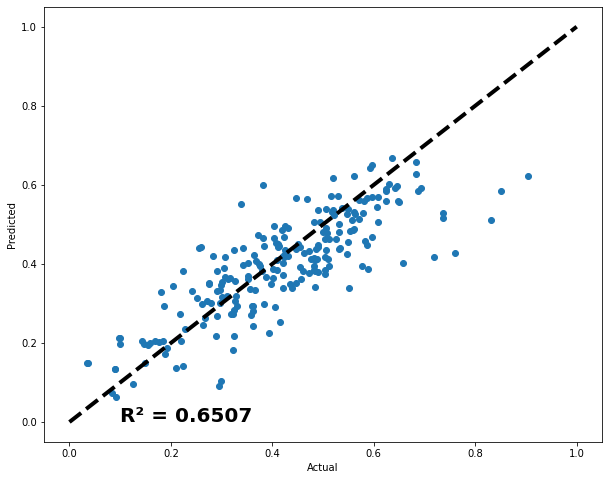

In [156]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled, pred_test_mlp_full)
ax.plot([test_scaled.min(), test_scaled.max()], [test_scaled.min(), test_scaled.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled, pred_test_mlp_full)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/mlp/r2.png")
plt.show()


## Optuna MLP

In [63]:
import optuna
from tensorflow_addons.metrics import RSquare
from keras.backend import clear_session


def mlp_optuna(trial):
    clear_session()

    input_shape=(X_train_full.shape[1],1)
    #optimizer = Adam(lr=0.001)

    model = Sequential()
    # 2. Suggest values of the hyperparameters using a trial object.
    model.add(
        Dense(units=trial.suggest_categorical('units_1', [64,128,256]), 
            activation='relu',
            input_shape=input_shape))
    model.add(
        Dense(units=trial.suggest_categorical('units_2', [8,16,32,64]), 
            activation='relu'))
    model.add(
        Dense(units=trial.suggest_categorical('units_3', [4,8]), 
            activation='relu'))
    model.add(Flatten())    
    model.add(Dense(1))

    # We compile our model with a sampled learning rate.
    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=[RSquare()])
    
    model.fit(X_train_scaled, y_train_scaled, epochs=trial.suggest_int('epochs',150,400,10), batch_size=4, verbose=False)
    score = model.evaluate(X_test_scaled, y_test_scaled, batch_size=1,verbose=0)
    return score[1]



In [64]:
study_mlp = optuna.create_study(direction="maximize")
study_mlp.optimize(mlp_optuna, n_trials=100)

print("Number of finished trials: {}".format(len(study_mlp.trials)))

print("Best trial:")
trial_mlp = study_mlp.best_trial

print("  Value: {}".format(trial_mlp.value))

print("  Params: ")
for key, value in trial_mlp.params.items():
    print("    {}: {}".format(key, value))

[I 2023-10-29 00:50:21,893] A new study created in memory with name: no-name-9b62ad0c-ab09-485f-b176-fad059c9550b
[I 2023-10-29 00:51:05,590] Trial 0 finished with value: 0.6608467102050781 and parameters: {'units_1': 64, 'units_2': 32, 'units_3': 8, 'lr': 0.00018346891263500706, 'epochs': 250}. Best is trial 0 with value: 0.6608467102050781.
[I 2023-10-29 00:52:16,139] Trial 1 finished with value: 0.6239681243896484 and parameters: {'units_1': 128, 'units_2': 32, 'units_3': 8, 'lr': 0.000709859534764166, 'epochs': 340}. Best is trial 0 with value: 0.6608467102050781.
[I 2023-10-29 00:53:39,021] Trial 2 finished with value: 0.6537786722183228 and parameters: {'units_1': 64, 'units_2': 64, 'units_3': 8, 'lr': 0.00028176335771147376, 'epochs': 360}. Best is trial 0 with value: 0.6608467102050781.
[I 2023-10-29 00:54:29,539] Trial 3 finished with value: -0.002237558364868164 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 4, 'lr': 0.0002320293308514172, 'epochs': 170}. Best is 

Number of finished trials: 100
Best trial:
  Value: 0.6675706505775452
  Params: 
    units_1: 128
    units_2: 32
    units_3: 4
    lr: 0.0003212830798480625
    epochs: 210


## XGBOOST

In [163]:
#xg_reg_full = xgb.XGBRegressor(objective ='reg:squarederror') 

param = {
    'max_depth':6 ,
    'learning_rate': 0.14015601809419814,
    'n_estimators': 744,
    'min_child_weight': 8,
    'gamma': 0.013260239674365806,
    'subsample': 0.884829118376078,
    'colsample_bytree': 0.8792481524161871,
    'reg_alpha': 0.9984791951138036,
    'reg_lambda': 0.5255574317490082,
    'random_state': 129 
}
xg_reg_full = xgb.XGBRegressor(**param)

In [164]:
model_= xg_reg_full.fit(X_train_scaled,y_train_scaled) 

In [165]:
pred_xgb_full = xg_reg_full.predict(X_test_scaled)
pred_train_xgb_full = xg_reg_full.predict(X_train_scaled)


In [166]:
rmse_xgb_full = np.sqrt(mean_squared_error(y_test_scaled, pred_xgb_full)) 

print("RMSE: %f" % (rmse_xgb_full)) 

RMSE: 0.082893


In [89]:
fig, ax = plt.subplots(figsize=(500, 150))
xgb.plot_tree(model_, num_trees=0, ax=ax)
#plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/Case2/xgb.png")
plt.show()

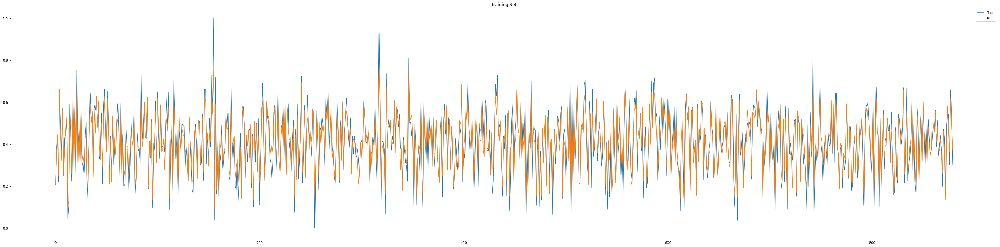

Training Set R-Square= 0.8964596418622356


In [170]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/train.png")

plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_scaled,pred_train_xgb_full)
print("Training Set R-Square=", rf_indices_r2_train_full)

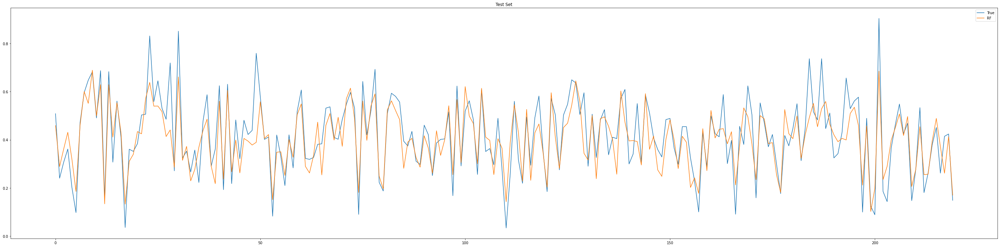

Test Set R-Square= 0.731254333588916


In [171]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/test.png")

plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_scaled,pred_xgb_full)
print("Test Set R-Square=", rf_indices_r2_test_full)

0.731254333588916


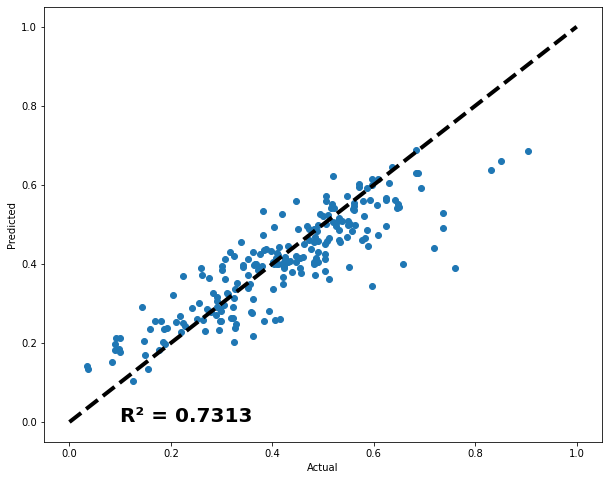

In [172]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled, pred_xgb_full)
ax.plot([test_scaled.min(), test_scaled.max()], [test_scaled.min(), test_scaled.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled, pred_xgb_full)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case1/xgboost/r2.png")
print(r2_score(y_test_scaled, pred_xgb_full))
plt.show()



## Optuna XGBosst

In [26]:
import optuna
def optuna_xgb(trial):
    param = {
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.01, 1.0),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
        'random_state': trial.suggest_int('random_state', 1, 1000)
    }
    model = xgb.XGBRegressor(**param)
    model.fit(X_train_scaled, y_train_scaled)
    y_pred = model.predict(X_test_scaled)
    return mean_squared_error(y_test_scaled, y_pred)

# Create the study
study_xgb = optuna.create_study(direction='minimize', study_name='regression')
study_xgb.optimize(optuna_xgb, n_trials=100)

[I 2023-10-28 21:59:19,411] A new study created in memory with name: regression
[I 2023-10-28 21:59:19,865] Trial 0 finished with value: 0.016853023241665814 and parameters: {'max_depth': 6, 'learning_rate': 0.12512455013513732, 'n_estimators': 346, 'min_child_weight': 8, 'gamma': 0.4992445892498466, 'subsample': 0.2764769490650478, 'colsample_bytree': 0.31352297832829723, 'reg_alpha': 0.7262573349214523, 'reg_lambda': 0.3909999055429014, 'random_state': 235}. Best is trial 0 with value: 0.016853023241665814.
[I 2023-10-28 21:59:20,032] Trial 1 finished with value: 0.01472258658809247 and parameters: {'max_depth': 1, 'learning_rate': 0.03299481202288948, 'n_estimators': 234, 'min_child_weight': 3, 'gamma': 0.357618758924095, 'subsample': 0.8052115839193429, 'colsample_bytree': 0.5032621502640113, 'reg_alpha': 0.47439731117906747, 'reg_lambda': 0.07760556984310607, 'random_state': 129}. Best is trial 1 with value: 0.01472258658809247.
[I 2023-10-28 21:59:20,484] Trial 2 finished with va

In [162]:
print("Number of finished trials: {}".format(len(study_xgb.trials)))

print("Best trial:")
trial_xgb = study_xgb.best_trial

print("  Value: {}".format(trial_xgb.value))

print("  Params: ")
for key, value in trial_xgb.params.items():
    print("    {}: {}".format(key, value))

Number of finished trials: 100
Best trial:
  Value: 0.0068712298306655385
  Params: 
    max_depth: 6
    learning_rate: 0.14015601809419814
    n_estimators: 744
    min_child_weight: 8
    gamma: 0.013260239674365806
    subsample: 0.884829118376078
    colsample_bytree: 0.8792481524161871
    reg_alpha: 0.9984791951138036
    reg_lambda: 0.5255574317490082
    random_state: 129


# Case 2 - 10 + 15 days

In [13]:
full_df_10 = loader.combine_datasets(datasets,dataset_dict,total_dataset_number=5, selected_day=10)

In [14]:
"""
Removing Features:
Static: OCS, Bulk density, CEC
Dynamic: lst_day, lst_night, fpar, tmin, vp, lai
"""

'Total Nitrogen'

drop_feature_list = ['OCS', 'Bulk density', 'CEC' ,'lst_day', 'lst_nigth', 'fpar', 'tmin', 'vp', 'lai']
df_dropped_10 = full_df_10.drop(drop_feature_list,axis=1)

In [15]:
vector_df_10, _ = loader.vectorize_dataset(df_dropped_10)

In [16]:
vector_df_10_15 = pd.concat([vector_df_15,vector_df_10],axis=0)

In [17]:
vector_df_10_15

,evi_4,evi_5,evi_6,evi_7,evi_8,evi_9,dayl_4,dayl_5,dayl_6,dayl_7,...,pH_4,pH_5,pH_6,pH_7,pH_8,pH_9,pH,SOC,OCD,yield
0,0.310849,45896.016658,0.319848,427.239497,27.437770,9.549332,34.738435,154.599236,539.340720,241.478909,...,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,2617.824646,4.973312,131.016430,906.0
1,0.336559,46254.087089,0.221124,445.857697,28.149444,17.429897,95.798961,154.125211,308.963687,393.967130,...,154.125211,308.963687,393.967130,100.792664,53.429210,1064.655667,1064.655667,58.750118,153.173881,983.0
2,0.336853,46295.602571,0.621514,435.435894,28.558294,19.550295,97.355930,150.862889,273.146413,410.812365,...,150.862889,273.146413,410.812365,109.764601,52.214165,1067.024366,1067.024366,38.610076,150.685079,964.0
3,0.360703,45978.737251,0.000000,445.037145,28.957153,6.257261,28.802221,160.232886,663.365493,130.701087,...,160.232886,663.365493,130.701087,59.933976,54.598065,859.944129,859.944129,21.015287,140.017393,800.0
4,0.380783,45973.194882,0.043116,453.083244,28.941340,6.849353,36.950674,157.265212,644.284111,159.153368,...,157.265212,644.284111,159.153368,77.696829,51.155335,969.720436,969.720436,16.696927,130.917712,857.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.256489,45339.784314,0.609833,421.028353,28.074751,10.505326,70.613963,175.779677,178.360079,392.798638,...,175.779677,178.360079,392.798638,267.768370,68.298912,1214.751463,1214.751463,3.542135,184.377850,1007.0
1096,0.307105,45800.129329,1.948428,444.296984,23.393893,12.407171,57.328288,168.588090,295.737775,400.648040,...,168.588090,295.737775,400.648040,177.292773,74.770346,1014.992316,1014.992316,30.698133,131.214816,483.0
1097,0.221419,45100.854776,0.706716,453.588649,31.524284,6.938106,28.407998,165.075644,546.275191,179.360253,...,165.075644,546.275191,179.360253,176.403242,76.559601,1005.625344,1005.625344,5.454114,132.518912,701.0
1098,0.260353,45464.647683,4.304286,412.401931,26.906139,19.153392,158.430578,175.741669,130.928545,464.448651,...,175.741669,130.928545,464.448651,373.127370,76.310138,1036.009102,1036.009102,28.895865,166.142748,588.0


In [19]:
def minmax_scaler(target,df_vector):
    np_train = df_vector.drop(target,axis=1).to_numpy()
    np_test = df_vector[target].to_numpy()

    X_train, X_test, y_train, y_test = train_test_split(np_train, np_test, test_size=0.20, random_state=34)

    scalerX = MinMaxScaler()
    scalerX.fit(X_train)
    X_train_minmax_scaled= scalerX.transform(X_train)
    X_test_minmax_scaled = scalerX.transform(X_test)

    scalerY = MinMaxScaler()
    scalerY.fit(y_train.reshape(-1, 1))
    y_train_minmax_scaled = scalerY.transform(y_train.reshape(-1, 1))
    y_test_minmax_scaled = scalerY.transform(y_test.reshape(-1, 1))
    test_minmax_scaled = scalerY.transform(test.reshape(-1, 1))
    
    return scalerX,scalerY,X_train_minmax_scaled,X_test_minmax_scaled,y_train_minmax_scaled,y_test_minmax_scaled,test_minmax_scaled



In [20]:
scalerX_10_15,scalerY_10_15,X_train_scaled_10_15,X_test_scaled_10_15,y_train_scaled_10_15,y_test_scaled_10_15,test_scaled_10_15 = minmax_scaler(target,vector_df_10_15)

## LSTM

In [33]:
clear_session()

LSTM_full_10_15 = Sequential()
LSTM_full_10_15.add(LSTM(64, activation='tanh', input_shape=(X_train_scaled_10_15.shape[1],1)))
LSTM_full_10_15.add(Dense(1))

optimizer = Adam(lr=0.0009669250179396106)

LSTM_full_10_15.compile(optimizer=optimizer, loss='mse',metrics=[RSquare()])

history_full_lstm_10_15 = LSTM_full_10_15.fit(X_train_scaled_10_15, y_train_scaled_10_15, epochs=300, batch_size=8)

Epoch 1/300
220/220 [==============================] - 5s 15ms/step - loss: 0.0310 - r_square: -0.3535
Epoch 2/300
220/220 [==============================] - 3s 14ms/step - loss: 0.0237 - r_square: -0.0348
Epoch 3/300
220/220 [==============================] - 2s 11ms/step - loss: 0.0228 - r_square: 0.0038
Epoch 4/300
220/220 [==============================] - 3s 12ms/step - loss: 0.0221 - r_square: 0.0365
Epoch 5/300
220/220 [==============================] - 2s 11ms/step - loss: 0.0218 - r_square: 0.0496
Epoch 6/300
220/220 [==============================] - 2s 11ms/step - loss: 0.0203 - r_square: 0.1137
Epoch 7/300
220/220 [==============================] - 2s 11ms/step - loss: 0.0194 - r_square: 0.1544
Epoch 8/300
220/220 [==============================] - 2s 11ms/step - loss: 0.0193 - r_square: 0.1572
Epoch 9/300
220/220 [==============================] - 2s 11ms/step - loss: 0.0186 - r_square: 0.1882
Epoch 10/300
220/220 [==============================] - 2s 11ms/step - loss: 0.0

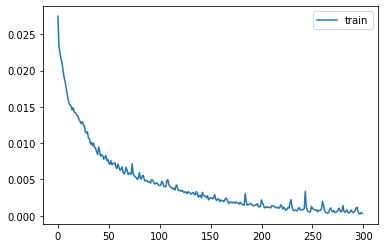

In [28]:
plt.plot(history_full_lstm_10_15.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/loss.png")
plt.show()

In [187]:
score = history_full_lstm_10_15.evaluate(X_test_scaled_10_15, y_test_scaled_10_15, batch_size=1)

AttributeError: 'History' object has no attribute 'evaluate'

In [29]:
pred_lstm_full_16 = LSTM_full_10_15.predict(X_test_scaled_10_15) 
pred_train_lstm_full_16 = LSTM_full_10_15.predict(X_train_scaled_10_15)

55/55 [==============================] - 1s 25ms/step


In [200]:
pred_train_lstm_full_16.shape
pred_lstm_full_16.shape

(440, 1)

In [30]:
rmse_lstm_full_16 = np.sqrt(mean_squared_error(y_test_scaled_10_15, pred_lstm_full_16)) 
print("RMSE: %f" % (rmse_lstm_full_16)) 

RMSE: 0.091095


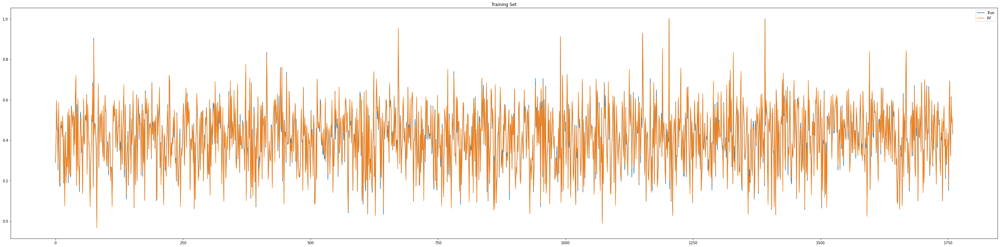

Training Set R-Square= 0.9863649249083718


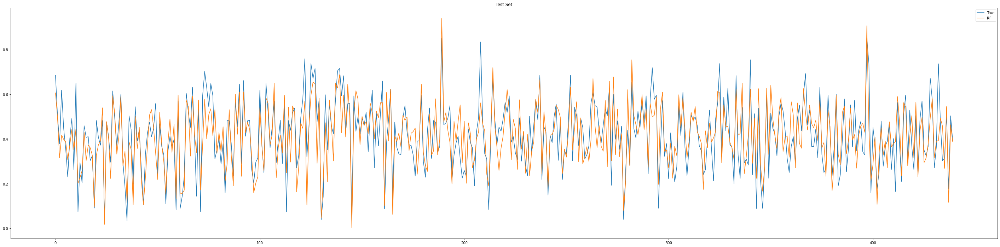

Test Set R-Square= 0.6514074969913


In [31]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full_16)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/train.png")

plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_scaled_10_15 ,pred_train_lstm_full_16)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full_16)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/test.png")

plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_scaled_10_15,pred_lstm_full_16)
print("Test Set R-Square=", rf_indices_r2_test)

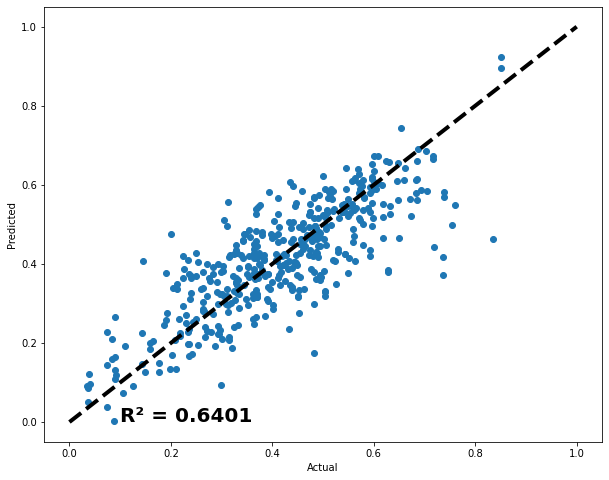

In [195]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15, pred_lstm_full_16)
ax.plot([test_scaled_10_15.min(), test_scaled_10_15.max()], [test_scaled_10_15.min(), test_scaled_10_15.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15, pred_lstm_full_16)),  (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/lstm/r2.png")

plt.show()

## Optuna LSTM

In [182]:
import optuna
from tensorflow_addons.metrics import RSquare
from keras.backend import clear_session


def lstm_optuna_case2(trial):
    clear_session()

    input_shape=(X_train_scaled_10_15.shape[1],1)
    #optimizer = Adam(lr=0.001)

    model = Sequential()
    # 2. Suggest values of the hyperparameters using a trial object.
    model.add(
        LSTM(units=trial.suggest_categorical('units', [16 ,32, 64, 128]), 
            activation='tanh',
            input_shape=input_shape))
    model.add(Dense(1))

    # We compile our model with a sampled learning rate.
    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=[RSquare()])
    
    model.fit(X_train_scaled_10_15, y_train_scaled_10_15, epochs=trial.suggest_int('epochs',250,450,10), batch_size=4, verbose=False)
    score = model.evaluate(X_test_scaled_10_15, y_test_scaled_10_15, batch_size=1,verbose=0)

    return score[1]



In [184]:
study_lstm_2 = optuna.create_study(direction="maximize")
study_lstm_2.optimize(lstm_optuna_case2, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm_2.trials)))

print("Best trial:")
trial_lstm_2 = study_lstm_2.best_trial

print("  Value: {}".format(trial_lstm_2.value))

print("  Params: ")
for key, value in trial_lstm_2.params.items():
    print("    {}: {}".format(key, value))

[I 2023-10-29 18:12:14,150] A new study created in memory with name: no-name-8e7d54df-4388-41cb-998e-542b03699fc2


[I 2023-10-29 18:34:06,129] Trial 0 finished with value: 0.6800127029418945 and parameters: {'units': 64, 'lr': 0.0008558432381922752, 'epochs': 250}. Best is trial 0 with value: 0.6800127029418945.
[I 2023-10-29 18:50:05,942] Trial 1 finished with value: 0.5773618817329407 and parameters: {'units': 16, 'lr': 0.0009513856508249928, 'epochs': 300}. Best is trial 0 with value: 0.6800127029418945.
[I 2023-10-29 19:04:05,092] Trial 2 finished with value: 0.6524996161460876 and parameters: {'units': 32, 'lr': 0.000493324648084258, 'epochs': 260}. Best is trial 0 with value: 0.6800127029418945.
[I 2023-10-29 19:47:17,726] Trial 3 finished with value: 0.7298488616943359 and parameters: {'units': 128, 'lr': 0.0009979805843283594, 'epochs': 350}. Best is trial 3 with value: 0.7298488616943359.
[I 2023-10-29 20:01:33,475] Trial 4 finished with value: 0.35463351011276245 and parameters: {'units': 16, 'lr': 0.0001397048907026962, 'epochs': 280}. Best is trial 3 with value: 0.7298488616943359.
[I 2

Number of finished trials: 50
Best trial:
  Value: 0.7298488616943359
  Params: 
    units: 128
    lr: 0.0009979805843283594
    epochs: 350


## MLP

In [32]:
from tensorflow.keras.optimizers.legacy import Adam 
from keras.models import Model,Sequential
from keras.layers import Dense, Flatten
from sklearn.metrics import r2_score
from keras.layers import Dropout

clear_session()
MLP_full_16 = Sequential()
MLP_full_16.add(Dense(256, activation="relu",input_shape=(X_train_scaled_10_15.shape[1],1)))
#MLP_full.add(Dropout(0.2))
MLP_full_16.add(Dense(64, activation="relu"))
#MLP_full.add(Dropout(0.4))
MLP_full_16.add(Dense(8, activation="relu"))
MLP_full_16.add(Flatten())    
MLP_full_16.add(Dense(1))
MLP_full_16.compile(loss='mse', optimizer=Adam(lr=0.0005761073539838296), metrics=[RSquare()])#,decay=1e-3 / 200))

history_MLP_full_16 = MLP_full_16.fit(X_train_scaled_10_15, y_train_scaled_10_15, epochs=320, batch_size=4)


Epoch 1/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0213 - r_square: 0.0688
Epoch 2/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0138 - r_square: 0.3983
Epoch 3/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0126 - r_square: 0.4514
Epoch 4/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0112 - r_square: 0.5092
Epoch 5/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0105 - r_square: 0.5420
Epoch 6/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0099 - r_square: 0.5692
Epoch 7/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0094 - r_square: 0.5882
Epoch 8/320
440/440 [==============================] - 1s 3ms/step - loss: 0.0094 - r_square: 0.5906
Epoch 9/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0089 - r_square: 0.6096
Epoch 10/320
440/440 [==============================] - 1s 2ms/step - loss: 0.0088 - r_squa

In [33]:
pred_train_mlp_full_16 = MLP_full_16.predict(X_train_scaled_10_15)
pred_test_mlp_full_16 = MLP_full_16.predict(X_test_scaled_10_15)

14/14 [==============================] - 0s 3ms/step


In [34]:
rmse_mlp_full_16 = np.sqrt(mean_squared_error(y_test_scaled_10_15, pred_test_mlp_full_16)) 
print("RMSE: %f" % (rmse_mlp_full_16)) 

RMSE: 0.089395


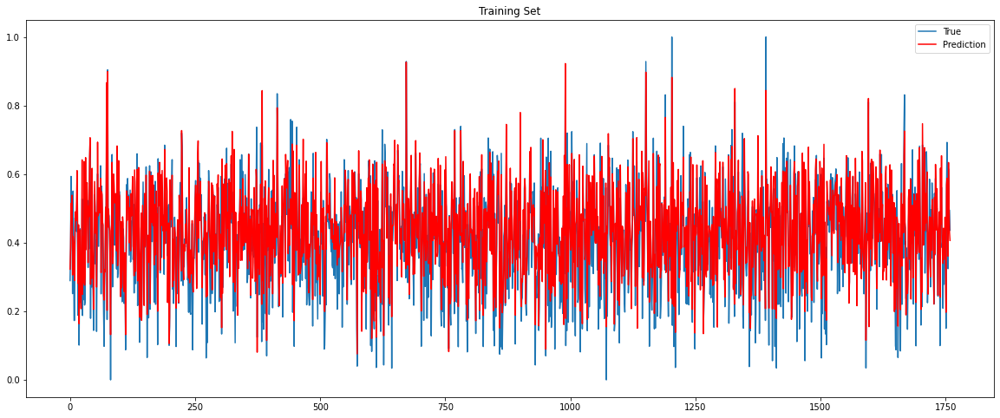

Training Set R-Square= 0.7578182427538446


In [35]:
plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_scaled_10_15))
plt.plot(pred_train_mlp_full_16,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_scaled_10_15,pred_train_mlp_full_16)
print("Training Set R-Square=", mlp_indices_r2_train)

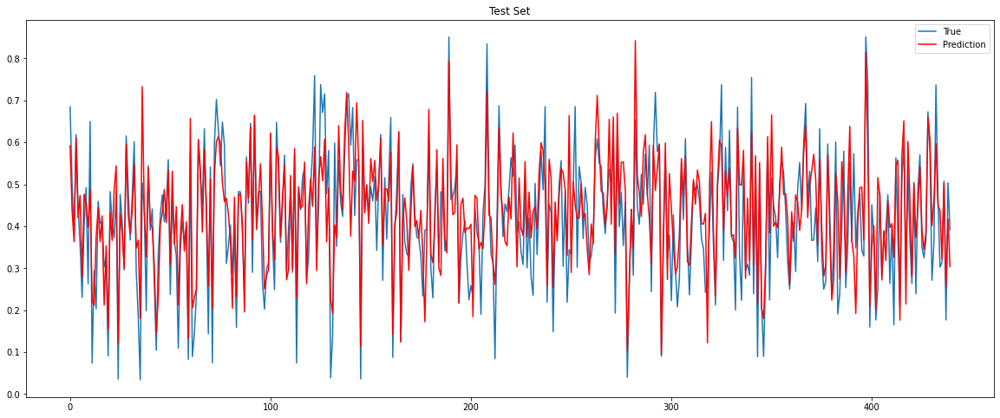

Test Set R-Square= 0.6642942262886022


In [36]:

plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_scaled_10_15))
plt.plot(pred_test_mlp_full_16,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_scaled_10_15,pred_test_mlp_full_16)
print("Test Set R-Square=", mlp_indices_r2_test)


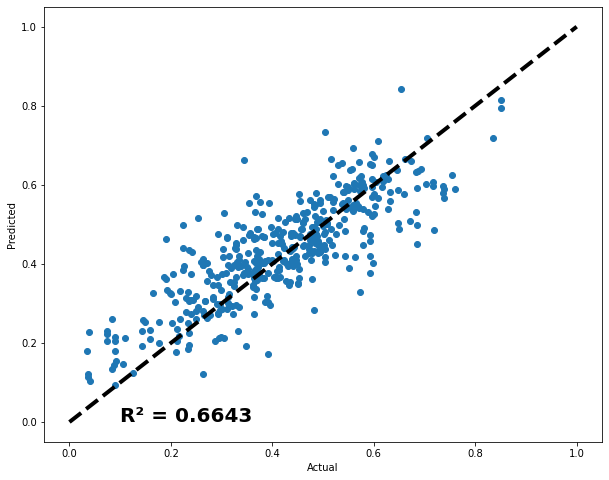

In [38]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15, pred_test_mlp_full_16)
ax.plot([test_scaled_10_15.min(), test_scaled_10_15.max()], [test_scaled_10_15.min(), test_scaled_10_15.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15, pred_test_mlp_full_16)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/mlp/r2.png")
plt.show()


## Optuna MLP

In [246]:
import optuna
from tensorflow_addons.metrics import RSquare
from keras.backend import clear_session


def mlp_optuna_2(trial):
    clear_session()

    input_shape=(X_train_scaled_10_15.shape[1],1)
    #optimizer = Adam(lr=0.001)

    model = Sequential()
    # 2. Suggest values of the hyperparameters using a trial object.
    model.add(
        Dense(units=trial.suggest_categorical('units_1', [64,128,256]), 
            activation='relu',
            input_shape=input_shape))
    model.add(
        Dense(units=trial.suggest_categorical('units_2', [8,16,32,64]), 
            activation='relu'))
    model.add(
        Dense(units=trial.suggest_categorical('units_3', [4,8]), 
            activation='relu'))
    model.add(Flatten())    
    model.add(Dense(1))

    # We compile our model with a sampled learning rate.
    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=[RSquare()])
    
    model.fit(X_train_scaled_10_15, y_train_scaled_10_15, epochs=trial.suggest_int('epochs',150,400,10), batch_size=4, verbose=False)
    score = model.evaluate(X_test_scaled_10_15, y_test_scaled_10_15, batch_size=1,verbose=0)
    return score[1]



In [247]:
study_mlp_2 = optuna.create_study(direction="maximize")
study_mlp_2.optimize(mlp_optuna_2, n_trials=100)

print("Number of finished trials: {}".format(len(study_mlp_2.trials)))

print("Best trial:")
trial_mlp_2 = study_mlp_2.best_trial

print("  Value: {}".format(trial_mlp_2.value))

print("  Params: ")
for key, value in trial_mlp_2.params.items():
    print("    {}: {}".format(key, value))

[I 2023-11-01 22:03:21,208] A new study created in memory with name: no-name-1985d213-007d-48dd-a2a2-5c17b08a2734
[I 2023-11-01 22:05:03,558] Trial 0 finished with value: 0.5566873550415039 and parameters: {'units_1': 64, 'units_2': 8, 'units_3': 4, 'lr': 0.00012106457299583025, 'epochs': 320}. Best is trial 0 with value: 0.5566873550415039.
[I 2023-11-01 22:08:12,155] Trial 1 finished with value: 0.6960165500640869 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0005761073539838296, 'epochs': 320}. Best is trial 1 with value: 0.6960165500640869.
[I 2023-11-01 22:10:09,358] Trial 2 finished with value: -0.0007399320602416992 and parameters: {'units_1': 256, 'units_2': 8, 'units_3': 4, 'lr': 0.00015357534566456466, 'epochs': 310}. Best is trial 1 with value: 0.6960165500640869.
[I 2023-11-01 22:12:19,488] Trial 3 finished with value: 0.658521294593811 and parameters: {'units_1': 256, 'units_2': 64, 'units_3': 8, 'lr': 0.0004931328667552323, 'epochs': 220}. Best is 

: 

## XGBOOST

In [240]:

param = {
    'max_depth': trial_xgb_2.params['max_depth'],
    'learning_rate': trial_xgb_2.params['learning_rate'],
    'n_estimators': trial_xgb_2.params['n_estimators'],
    'min_child_weight': trial_xgb_2.params['min_child_weight'],
    'gamma': trial_xgb_2.params['gamma'],
    'subsample': trial_xgb_2.params['subsample'],
    'colsample_bytree': trial_xgb_2.params['colsample_bytree'],
    'reg_alpha': trial_xgb_2.params['reg_alpha'],
    'reg_lambda': trial_xgb_2.params['reg_lambda'],
    'random_state': trial_xgb_2.params['random_state']
}

xg_reg_full_16 = xgb.XGBRegressor(**param)
xg_reg_full_16.fit(X_train_scaled_10_15,y_train_scaled_10_15) 

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.20964800111526985, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.010710658638214606, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.22833039072845693, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=4, missing=nan, monotone_constraints=None,
             n_estimators=841, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=742, ...)

In [241]:
pred_xgb_full_16 = xg_reg_full_16.predict(X_test_scaled_10_15)
pred_train_xgb_full_16 = xg_reg_full_16.predict(X_train_scaled_10_15)


In [242]:
rmse_xgb_full = np.sqrt(mean_squared_error(y_test_scaled_10_15, pred_xgb_full_16)) 

print("RMSE: %f" % (rmse_xgb_full)) 

RMSE: 0.069146


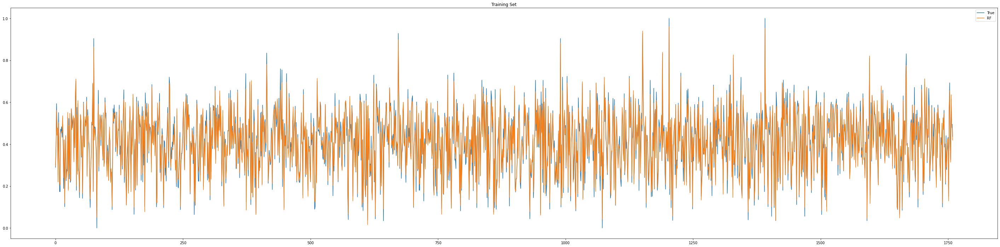

Training Set R-Square= 0.9667417914997178


In [243]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full_16)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_scaled_10_15,pred_train_xgb_full_16)
print("Training Set R-Square=", rf_indices_r2_train_full)

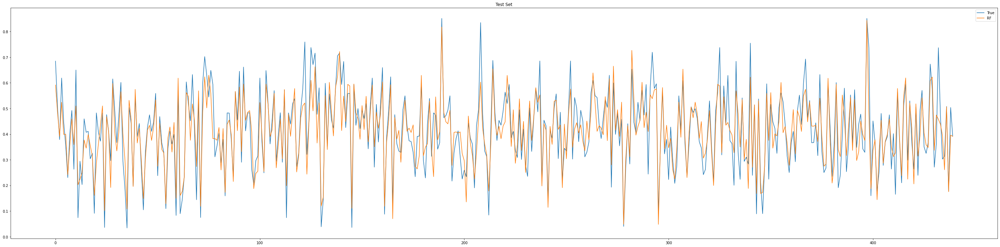

Test Set R-Square= 0.7991518446533374


In [244]:
plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full_16)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_scaled_10_15,pred_xgb_full_16)
print("Test Set R-Square=", rf_indices_r2_test_full)

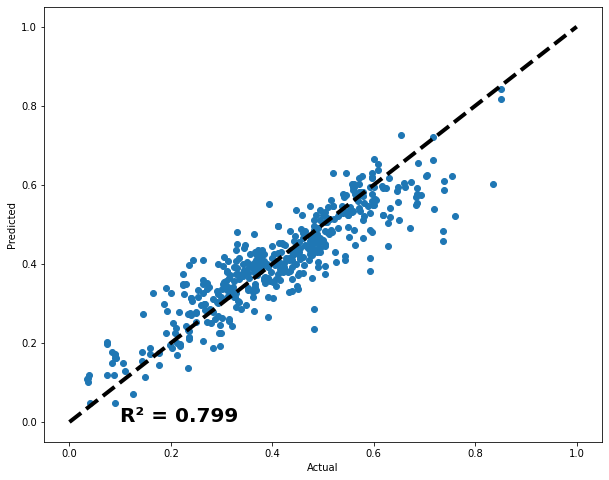

In [245]:
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15, pred_xgb_full_16)
ax.plot([test_scaled_10_15.min(), test_scaled_10_15.max()], [test_scaled_10_15.min(), test_scaled_10_15.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_scaled_10_15, pred_xgb_full_16)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case2/xgboost/r2.png")

plt.show()


## Optuna XGBoost

In [238]:
import optuna
def optuna_xgb_2(trial):
    param = {
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.01, 1.0),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
        'random_state': trial.suggest_int('random_state', 1, 1000)
    }
    model = xgb.XGBRegressor(**param)
    model.fit(X_train_scaled_10_15, y_train_scaled_10_15)
    y_pred = model.predict(X_test_scaled_10_15)
    return mean_squared_error(y_test_scaled_10_15, y_pred)

# Create the study
study_xgb_2 = optuna.create_study(direction='minimize', study_name='regression')
study_xgb_2.optimize(optuna_xgb_2, n_trials=100)

[I 2023-11-01 21:31:43,923] A new study created in memory with name: regression
[I 2023-11-01 21:31:47,371] Trial 0 finished with value: 0.012350413850777085 and parameters: {'max_depth': 7, 'learning_rate': 0.038104860840073446, 'n_estimators': 494, 'min_child_weight': 7, 'gamma': 0.5066719911743799, 'subsample': 0.38871209054939765, 'colsample_bytree': 0.866529682636399, 'reg_alpha': 0.6472468131240569, 'reg_lambda': 0.34801169702825696, 'random_state': 27}. Best is trial 0 with value: 0.012350413850777085.
[I 2023-11-01 21:31:50,257] Trial 1 finished with value: 0.013432533243620965 and parameters: {'max_depth': 7, 'learning_rate': 0.6738285367930781, 'n_estimators': 451, 'min_child_weight': 1, 'gamma': 0.9423501048318204, 'subsample': 0.32459584079689924, 'colsample_bytree': 0.5665446320002788, 'reg_alpha': 0.45579482421002776, 'reg_lambda': 0.9761757535647578, 'random_state': 539}. Best is trial 0 with value: 0.012350413850777085.
[I 2023-11-01 21:31:55,155] Trial 2 finished with 

In [239]:
print("Number of finished trials: {}".format(len(study_xgb_2.trials)))

print("Best trial:")
trial_xgb_2 = study_xgb_2.best_trial

print("  Value: {}".format(trial_xgb_2.value))

print("  Params: ")
for key, value in trial_xgb_2.params.items():
    print("    {}: {}".format(key, value))

Number of finished trials: 100
Best trial:
  Value: 0.004781210171168841
  Params: 
    max_depth: 4
    learning_rate: 0.22833039072845693
    n_estimators: 841
    min_child_weight: 4
    gamma: 0.010710658638214606
    subsample: 0.8600247768404645
    colsample_bytree: 0.20964800111526985
    reg_alpha: 0.015030524194439253
    reg_lambda: 0.6645763114539691
    random_state: 742


# Case 3 - 10 + 15 + 20 days 

In [21]:
full_df_20 = loader.combine_datasets(datasets,dataset_dict,total_dataset_number=5, selected_day=20)

In [22]:
"""
Removing Features:
Static: OCS, Bulk density, CEC
Dynamic: lst_day, lst_night, fpar, tmin, vp, lai
"""

'Total Nitrogen'

drop_feature_list = ['OCS', 'Bulk density', 'CEC' ,'lst_day', 'lst_nigth', 'fpar', 'tmin', 'vp', 'lai']
df_dropped_20 = full_df_20.drop(drop_feature_list,axis=1)

In [23]:
vector_df_20, _ = loader.vectorize_dataset(df_dropped_20)

In [24]:
vector_df_10_15_20 = pd.concat([vector_df_10_15,vector_df_20],axis=0)

In [25]:
vector_df_10_15_20

,evi_4,evi_5,evi_6,evi_7,evi_8,evi_9,dayl_4,dayl_5,dayl_6,dayl_7,...,pH_4,pH_5,pH_6,pH_7,pH_8,pH_9,pH,SOC,OCD,yield
0,0.310849,45896.016658,0.319848,427.239497,27.437770,9.549332,34.738435,154.599236,539.340720,241.478909,...,154.599236,539.340720,241.478909,92.958904,52.015565,2617.824646,2617.824646,4.973312,131.016430,906.0
1,0.336559,46254.087089,0.221124,445.857697,28.149444,17.429897,95.798961,154.125211,308.963687,393.967130,...,154.125211,308.963687,393.967130,100.792664,53.429210,1064.655667,1064.655667,58.750118,153.173881,983.0
2,0.336853,46295.602571,0.621514,435.435894,28.558294,19.550295,97.355930,150.862889,273.146413,410.812365,...,150.862889,273.146413,410.812365,109.764601,52.214165,1067.024366,1067.024366,38.610076,150.685079,964.0
3,0.360703,45978.737251,0.000000,445.037145,28.957153,6.257261,28.802221,160.232886,663.365493,130.701087,...,160.232886,663.365493,130.701087,59.933976,54.598065,859.944129,859.944129,21.015287,140.017393,800.0
4,0.380783,45973.194882,0.043116,453.083244,28.941340,6.849353,36.950674,157.265212,644.284111,159.153368,...,157.265212,644.284111,159.153368,77.696829,51.155335,969.720436,969.720436,16.696927,130.917712,857.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.211578,46357.187547,2.722945,428.064115,28.431715,11.041425,68.478351,175.779677,178.360079,392.798638,...,175.779677,178.360079,392.798638,267.768370,68.298912,1214.751463,1214.751463,3.542135,184.377850,1007.0
1096,0.248206,47038.595449,0.000000,492.408329,24.120148,7.686342,40.951802,168.588090,295.737775,400.648040,...,168.588090,295.737775,400.648040,177.292773,74.770346,1014.992316,1014.992316,30.698133,131.214816,483.0
1097,0.190636,46003.948323,0.076448,488.732429,33.068488,5.760140,23.641046,165.075644,546.275191,179.360253,...,165.075644,546.275191,179.360253,176.403242,76.559601,1005.625344,1005.625344,5.454114,132.518912,701.0
1098,0.153570,46541.895738,3.068378,437.548532,26.266409,15.305653,139.709558,175.741669,130.928545,464.448651,...,175.741669,130.928545,464.448651,373.127370,76.310138,1036.009102,1036.009102,28.895865,166.142748,588.0


In [ ]:
def minmax_scaler(target,df_vector):
    np_train = df_vector.drop(target,axis=1).to_numpy()
    np_test = df_vector[target].to_numpy()

    X_train, X_test, y_train, y_test = train_test_split(np_train, np_test, test_size=0.20, random_state=34)

    scalerX = MinMaxScaler()
    scalerX.fit(X_train)
    X_train_minmax_scaled= scalerX.transform(X_train)
    X_test_minmax_scaled = scalerX.transform(X_test)

    scalerY = MinMaxScaler()
    scalerY.fit(y_train.reshape(-1, 1))
    y_train_minmax_scaled = scalerY.transform(y_train.reshape(-1, 1))
    y_test_minmax_scaled = scalerY.transform(y_test.reshape(-1, 1))
    test_minmax_scaled = scalerY.transform(test.reshape(-1, 1))
    
    return scalerX,scalerY,X_train_minmax_scaled,X_test_minmax_scaled,y_train_minmax_scaled,y_test_minmax_scaled,test_minmax_scaled


In [26]:
scalerX_10_15_20,scalerY_10_15_20,X_train_scaled_10_15_20,X_test_scaled_10_15_20,y_train_scaled_10_15_20,y_test_scaled_10_15_20,test_scaled_10_15_20 = minmax_scaler(target,vector_df_10_15_20)

## Train Test Split

## LSTM

In [224]:
clear_session()

LSTM_full_14 = Sequential()
LSTM_full_14.add(LSTM(128, activation='relu', input_shape=(X_train_scaled_10_15_20.shape[1], 1)))
LSTM_full_14.add(Dense(1))

optimizer = Adam(lr=0.0006988135685611857)

LSTM_full_14.compile(optimizer=optimizer, loss='mse',metrics=[RSquare()])

history_full_lstm_14 = LSTM_full_14.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20, epochs=290, batch_size=8)

Epoch 1/290
330/330 [==============================] - 11s 28ms/step - loss: 0.0306 - r_square: -0.3299
Epoch 2/290
330/330 [==============================] - 8s 25ms/step - loss: 0.0239 - r_square: -0.0386
Epoch 3/290
330/330 [==============================] - 8s 25ms/step - loss: 0.0233 - r_square: -0.0121
Epoch 4/290
330/330 [==============================] - 8s 25ms/step - loss: 0.0220 - r_square: 0.0470
Epoch 5/290
330/330 [==============================] - 8s 26ms/step - loss: 0.0257 - r_square: -0.1173
Epoch 6/290
330/330 [==============================] - 9s 28ms/step - loss: 0.0225 - r_square: 0.0249
Epoch 7/290
330/330 [==============================] - 9s 27ms/step - loss: 0.0221 - r_square: 0.0390
Epoch 8/290
330/330 [==============================] - 9s 28ms/step - loss: 0.0218 - r_square: 0.0525
Epoch 9/290
330/330 [==============================] - 8s 25ms/step - loss: 0.0214 - r_square: 0.0709
Epoch 10/290
330/330 [==============================] - 9s 27ms/step - loss: 

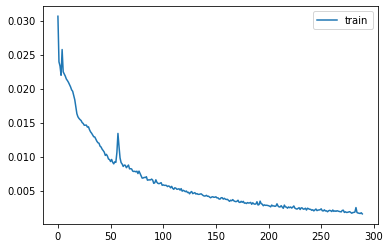

In [225]:
plt.plot(history_full_lstm_14.history['loss'], label='train')
plt.legend()
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/loss.png")
plt.show()

83/83 [==============================] - 2s 19ms/step
RMSE: 0.075791


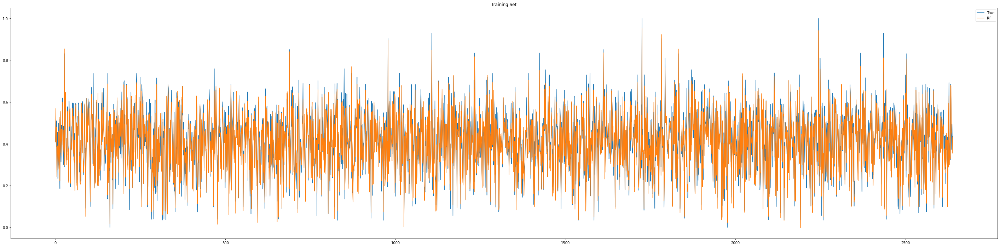

Training Set R-Square= 0.9353438924835251


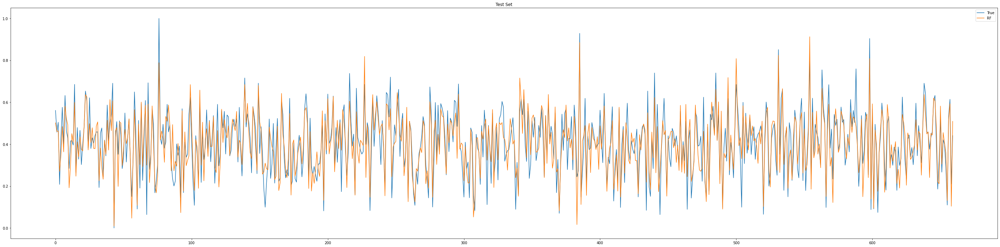

Test Set R-Square= 0.7531507896231437


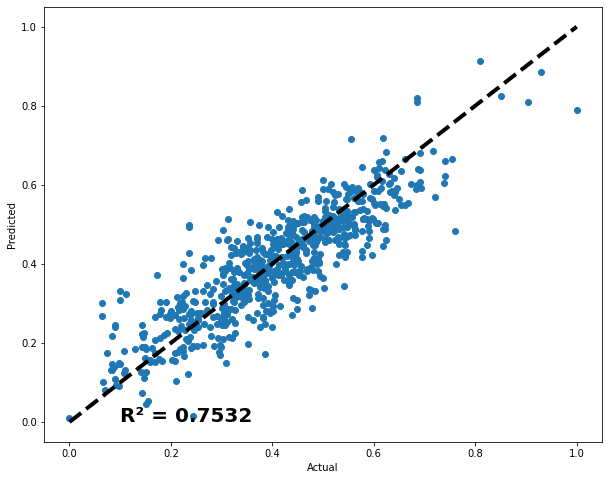

In [228]:
score = LSTM_full_14.evaluate(X_test_scaled_10_15_20, y_test_scaled_10_15_20, batch_size=1)

pred_lstm_full_14 = LSTM_full_14.predict(X_test_scaled_10_15_20) 
pred_train_lstm_full_14 = LSTM_full_14.predict(X_train_scaled_10_15_20)

rmse_lstm_full_14 = np.sqrt(mean_squared_error(y_test_scaled_10_15_20, pred_lstm_full_14)) 
print("RMSE: %f" % (rmse_lstm_full_14)) 

plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_lstm_full_14)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train = r2_score(y_train_scaled_10_15_20 ,pred_train_lstm_full_14)
print("Training Set R-Square=", rf_indices_r2_train)


plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_lstm_full_14)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for test set
rf_indices_r2_test = r2_score(y_test_scaled_10_15_20,pred_lstm_full_14)
print("Test Set R-Square=", rf_indices_r2_test)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15_20, pred_lstm_full_14)
ax.plot([test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], [test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15_20, pred_lstm_full_14)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/lstm/r2.png")
plt.show()



## Optuna LSTM

In [219]:
import optuna
from tensorflow_addons.metrics import RSquare
from keras.backend import clear_session


def lstm_optuna_case3(trial):
    clear_session()

    input_shape=(X_train_scaled_10_15_20.shape[1],1)
    #optimizer = Adam(lr=0.001)

    model = Sequential()
    # 2. Suggest values of the hyperparameters using a trial object.
    model.add(
        LSTM(units=trial.suggest_categorical('units', [16 ,32, 64, 128]), 
            activation='tanh',
            input_shape=input_shape))
    model.add(Dense(1))

    # We compile our model with a sampled learning rate.
    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=[RSquare()])
    
    model.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20, epochs=trial.suggest_int('epochs',250,450,10), batch_size=8, verbose=False)
    score = model.evaluate(X_test_scaled_10_15_20, y_test_scaled_10_15_20, batch_size=1,verbose=0)

    return score[1]



In [220]:
study_lstm_3 = optuna.create_study(direction="maximize")
study_lstm_3.optimize(lstm_optuna_case3, n_trials=50)

print("Number of finished trials: {}".format(len(study_lstm_3.trials)))

print("Best trial:")
trial_lstm_3 = study_lstm_3.best_trial

print("  Value: {}".format(trial_lstm_3.value))

print("  Params: ")
for key, value in trial_lstm_3.params.items():
    print("    {}: {}".format(key, value))

[I 2023-10-31 07:54:00,510] A new study created in memory with name: no-name-4d455d21-7cc5-49fc-bcd0-c88357e30cca


[I 2023-10-31 08:05:05,187] Trial 0 finished with value: 0.4299857020378113 and parameters: {'units': 16, 'lr': 0.00025803089749830156, 'epochs': 450}. Best is trial 0 with value: 0.4299857020378113.
[I 2023-10-31 08:26:48,631] Trial 1 finished with value: 0.735160231590271 and parameters: {'units': 128, 'lr': 0.0008765130641438187, 'epochs': 290}. Best is trial 1 with value: 0.735160231590271.
[I 2023-10-31 08:36:36,692] Trial 2 finished with value: 0.65763920545578 and parameters: {'units': 64, 'lr': 0.0005219791003103036, 'epochs': 270}. Best is trial 1 with value: 0.735160231590271.
[I 2023-10-31 09:10:50,298] Trial 3 finished with value: 0.7098445892333984 and parameters: {'units': 128, 'lr': 0.0004747999651063744, 'epochs': 450}. Best is trial 1 with value: 0.735160231590271.
[I 2023-10-31 09:20:48,302] Trial 4 finished with value: 0.6240494251251221 and parameters: {'units': 32, 'lr': 0.0009026151847786213, 'epochs': 370}. Best is trial 1 with value: 0.735160231590271.
[I 2023-1

Number of finished trials: 50
Best trial:
  Value: 0.7586585283279419
  Params: 
    units: 128
    lr: 0.0006988135685611857
    epochs: 290


## Optuna MLP

In [27]:
import optuna
from tensorflow_addons.metrics import RSquare
from keras.backend import clear_session
from keras.layers import Dense, Flatten


def mlp_optuna_3(trial):
    clear_session()

    input_shape=(X_train_full.shape[1],1)
    #optimizer = Adam(lr=0.001)

    model = Sequential()
    # 2. Suggest values of the hyperparameters using a trial object.
    model.add(
        Dense(units=trial.suggest_categorical('units_1', [64,128,256]), 
            activation='relu',
            input_shape=input_shape))
    model.add(
        Dense(units=trial.suggest_categorical('units_2', [8,16,32,64]), 
            activation='relu'))
    model.add(
        Dense(units=trial.suggest_categorical('units_3', [4,8]), 
            activation='relu'))
    model.add(Flatten())    
    model.add(Dense(1))

    # We compile our model with a sampled learning rate.
    learning_r = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    model.compile(loss='mse', optimizer=Adam(lr=learning_r), metrics=[RSquare()])
    
    model.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20, epochs=trial.suggest_int('epochs',150,400,10), batch_size=8, verbose=False)
    score = model.evaluate(X_test_scaled_10_15_20, y_test_scaled_10_15_20, batch_size=1,verbose=0)
    return score[1]



In [28]:
study_mlp_3 = optuna.create_study(direction="maximize")
study_mlp_3.optimize(mlp_optuna_3, n_trials=100)

print("Number of finished trials: {}".format(len(study_mlp_3.trials)))

print("Best trial:")
trial_mlp_3 = study_mlp_3.best_trial

print("  Value: {}".format(trial_mlp_3.value))

print("  Params: ")
for key, value in trial_mlp_3.params.items():
    print("    {}: {}".format(key, value))

[I 2023-11-04 21:34:44,120] A new study created in memory with name: no-name-612ea676-d38b-453f-bba0-9cb2ec601fc7
2023-11-04 21:34:44.428551: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
[I 2023-11-04 21:37:58,540] Trial 0 finished with value: 0.6941496133804321 and parameters: {'units_1': 256, 'units_2': 32, 'units_3': 8, 'lr': 0.00018789234797438246, 'epochs': 380}. Best is trial 0 with value: 0.6941496133804321.
[I 2023-11-04 21:40:00,681] Trial 1 finished with value: 0.6569482088088989 and parameters: {'units_1': 256, 'units_2': 16, 'units_3': 8, 'lr': 0.0001697542210172349, 'epochs': 280}. Best is trial 0 with value: 0.6941496133804321.
[I 2023-11-04 21:41:10,778] Trial 2 finished with value: 0.6799266934394836 and parameters: {'units_1': 64, 'units_2': 16, 'units_3': 4, 'lr': 0.000693688950303857, 'epochs': 280}. Best is trial 0 with value: 0.6941496133804321.
[I 2023-11-04 21:42:40,050] Trial 3 finished with value: 0.6743124127388 

Number of finished trials: 100
Best trial:
  Value: 0.7267390489578247
  Params: 
    units_1: 256
    units_2: 64
    units_3: 8
    lr: 0.00023260227608851982
    epochs: 400


## MLP

In [30]:
from tensorflow.keras.optimizers.legacy import Adam 
from keras.models import Model,Sequential
from keras.layers import Dense, Flatten
from sklearn.metrics import r2_score
from keras.layers import Dropout

input_shape=(X_train_full.shape[1],1)

clear_session()
MLP_full_14 = Sequential()
MLP_full_14.add(Dense(256, activation="relu",input_shape=input_shape))
#MLP_full.add(Dropout(0.2))
MLP_full_14.add(Dense(64, activation="relu"))
#MLP_full.add(Dropout(0.4))
MLP_full_14.add(Dense(8, activation="relu"))
MLP_full_14.add(Flatten())    
MLP_full_14.add(Dense(1))
MLP_full_14.compile(loss='mse', optimizer=Adam(lr=0.00023260227608851982))#,decay=1e-3 / 200))

history_MLP_full_14 = MLP_full_14.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20, epochs=400, batch_size=1)


Epoch 1/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0186
Epoch 2/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0133
Epoch 3/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0118
Epoch 4/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0108
Epoch 5/400
2640/2640 [==============================] - 4s 1ms/step - loss: 0.0106
Epoch 6/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0103
Epoch 7/400
2640/2640 [==============================] - 3s 980us/step - loss: 0.0101
Epoch 8/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0099
Epoch 9/400
2640/2640 [==============================] - 3s 992us/step - loss: 0.0099
Epoch 10/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0096
Epoch 11/400
2640/2640 [==============================] - 3s 1ms/step - loss: 0.0094
Epoch 12/400
2640/2640 [==============================] - 4s 1ms/step 

21/21 [==============================] - 0s 3ms/step
RMSE: 0.086122


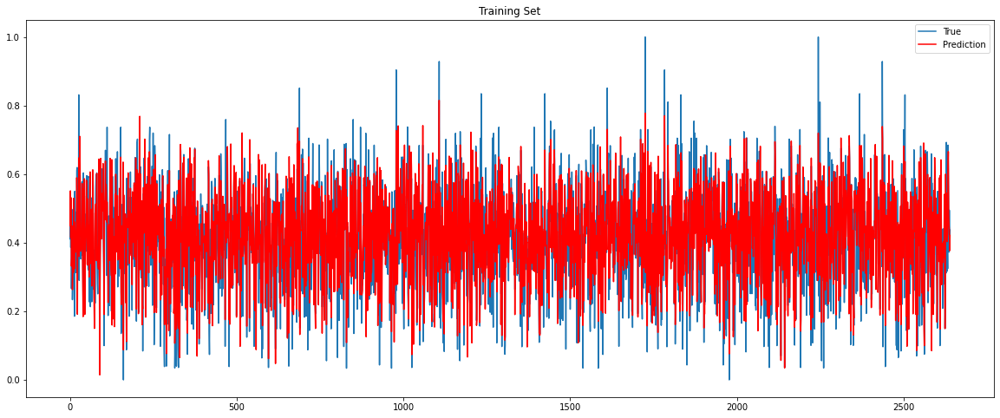

Training Set R-Square= 0.7054048599438016


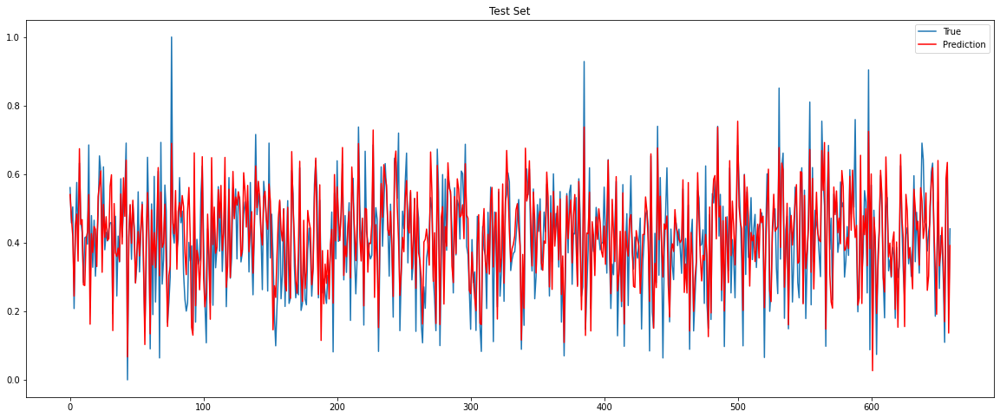

Test Set R-Square= 0.6812693160134772


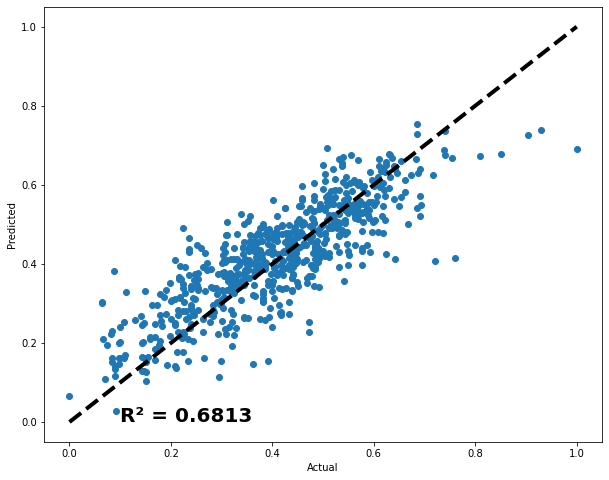

In [40]:
pred_train_mlp_full_14 = MLP_full_14.predict(X_train_scaled_10_15_20)
pred_test_mlp_full_14 = MLP_full_14.predict(X_test_scaled_10_15_20)

rmse_mlp_full_14 = np.sqrt(mean_squared_error(y_test_scaled_10_15_20, pred_test_mlp_full_14)) 
print("RMSE: %f" % (rmse_mlp_full_14)) 

plt.figure(figsize=(20,8))
plt.plot(np.array(y_train_scaled_10_15_20))
plt.plot(pred_train_mlp_full_14,'r')
plt.title("Average WFV predictions on train data")
plt.legend(["True", "Prediction"])
plt.title('Training Set')
plt.savefig("")
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_train = r2_score(y_train_scaled_10_15_20,pred_train_mlp_full_14)
print("Training Set R-Square=", mlp_indices_r2_train)


plt.figure(figsize=(20,8))
plt.plot(np.array(y_test_scaled_10_15_20))
plt.plot(pred_test_mlp_full_14,'r')
plt.title("Average WFV predictions on test data")
plt.legend(["True", "Prediction"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
mlp_indices_r2_test = r2_score(y_test_scaled_10_15_20,pred_test_mlp_full_14)
print("Test Set R-Square=", mlp_indices_r2_test)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15_20, pred_test_mlp_full_14)
ax.plot([test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], [test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.4f}".format(r2_score(y_test_scaled_10_15_20, pred_test_mlp_full_14)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/mlp/r2.png")
plt.show()




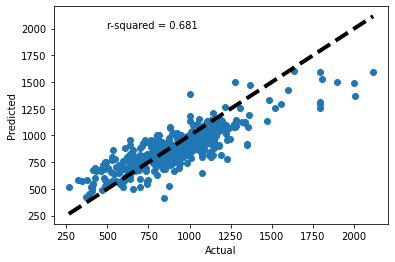

In [ ]:
fig, ax = plt.subplots()
ax.scatter(y_test_full_16, pred_test_mlp_full_16)
ax.plot([yield_full_16.min(), yield_full_16.max()], [yield_full_16.min(), yield_full_16.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("r-squared = {:.3f}".format(r2_score(y_test_full_16, pred_test_mlp_full_16)), (500, 2000))
plt.show()


## XGBoost

In [234]:

param = {
    'max_depth': trial_xgb_3.params['max_depth'],
    'learning_rate': trial_xgb_3.params['learning_rate'],
    'n_estimators': trial_xgb_3.params['n_estimators'],
    'min_child_weight': trial_xgb_3.params['min_child_weight'],
    'gamma': trial_xgb_3.params['gamma'],
    'subsample': trial_xgb_3.params['subsample'],
    'colsample_bytree': trial_xgb_3.params['colsample_bytree'],
    'reg_alpha': trial_xgb_3.params['reg_alpha'],
    'reg_lambda': trial_xgb_3.params['reg_lambda'],
    'random_state': trial_xgb_3.params['random_state']
}

xg_reg_full_14 = xgb.XGBRegressor(**param)
xg_reg_full_14.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.09841076552545186, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.013250717825604455, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.22263268291255955, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             n_estimators=835, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=641, ...)

RMSE: 0.064066


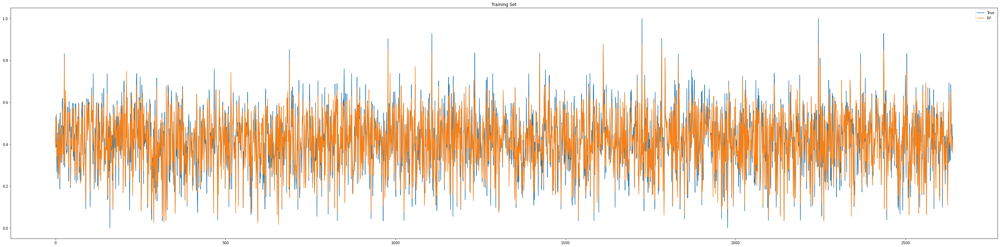

Training Set R-Square= 0.898739898556794


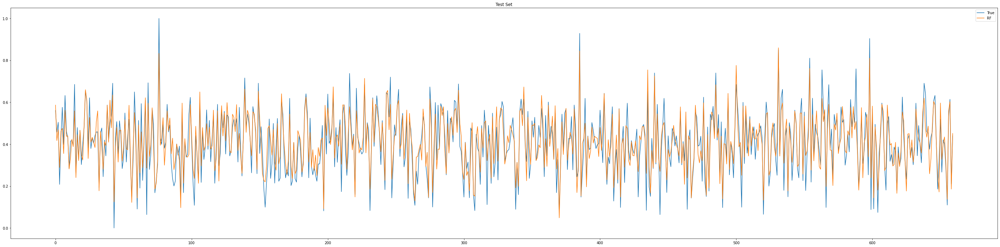

Test Set R-Square= 0.8236226892995983


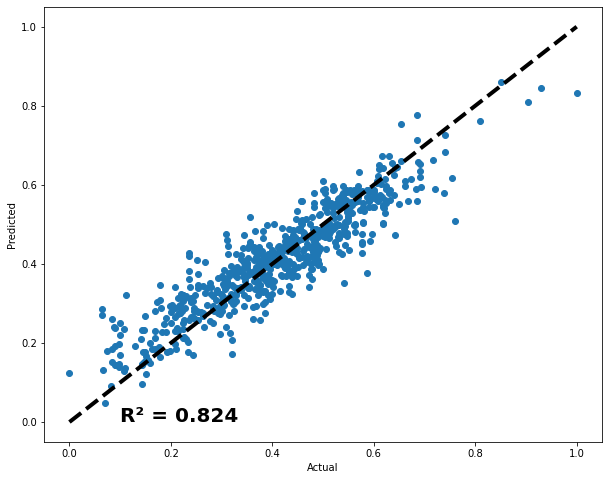

In [236]:
pred_xgb_full_14 = xg_reg_full_14.predict(X_test_scaled_10_15_20)
pred_train_xgb_full_14 = xg_reg_full_14.predict(X_train_scaled_10_15_20)

rmse_xgb_full_3 = np.sqrt(mean_squared_error(y_test_scaled_10_15_20, pred_xgb_full_14)) 

print("RMSE: %f" % (rmse_xgb_full_3)) 

plt.figure(figsize=(50,12))
plt.plot(np.array(y_train_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_train_xgb_full_14)

plt.title("Predictions on train data")
plt.legend(["True","RF"])
plt.title('Training Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_train_full = r2_score(y_train_scaled_10_15_20,pred_train_xgb_full_14)
print("Training Set R-Square=", rf_indices_r2_train_full)

plt.figure(figsize=(50,12))
plt.plot(np.array(y_test_scaled_10_15_20))
# plt.plot(pred_train_mlp)
plt.plot(pred_xgb_full_14)

plt.title("Predictions on test data")
plt.legend(["True","RF"])
plt.title('Test Set')
plt.show()

# Compute R-Square value for training set
rf_indices_r2_test_full = r2_score(y_test_scaled_10_15_20,pred_xgb_full_14)
print("Test Set R-Square=", rf_indices_r2_test_full)

fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(y_test_scaled_10_15_20, pred_xgb_full_14)
ax.plot([test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], [test_scaled_10_15_20.min(), test_scaled_10_15_20.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#regression line

ax.annotate("R² = {:.3f}".format(r2_score(y_test_scaled_10_15_20, pred_xgb_full_14)), (0.1, 0),fontsize=20, fontweight='bold')
plt.savefig("/Users/alperbalmumcu/Github/crop-yield-estimation/results/Case3/xgboost/r2.png")
plt.show()


## Optuna XGBoost

In [230]:
import optuna
def optuna_xgb_3(trial):
    param = {
        'max_depth': trial.suggest_int('max_depth', 1, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.01, 1.0),
        'subsample': trial.suggest_float('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.01, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.01, 1.0),
        'random_state': trial.suggest_int('random_state', 1, 1000)
    }
    model = xgb.XGBRegressor(**param)
    model.fit(X_train_scaled_10_15_20, y_train_scaled_10_15_20)
    y_pred = model.predict(X_test_scaled_10_15_20)
    return mean_squared_error(y_test_scaled_10_15_20, y_pred)

# Create the study
study_xgb_3 = optuna.create_study(direction='minimize', study_name='regression')
study_xgb_3.optimize(optuna_xgb_3, n_trials=100)

[I 2023-11-01 21:16:31,174] A new study created in memory with name: regression
[I 2023-11-01 21:16:40,387] Trial 0 finished with value: 0.008618909156232278 and parameters: {'max_depth': 8, 'learning_rate': 0.1580742967991036, 'n_estimators': 838, 'min_child_weight': 2, 'gamma': 0.46858365762275817, 'subsample': 0.9842808849390577, 'colsample_bytree': 0.42589954999124985, 'reg_alpha': 0.654863573980536, 'reg_lambda': 0.5902473382288522, 'random_state': 855}. Best is trial 0 with value: 0.008618909156232278.
[I 2023-11-01 21:16:43,505] Trial 1 finished with value: 0.00979338264816763 and parameters: {'max_depth': 9, 'learning_rate': 0.4314421937147358, 'n_estimators': 355, 'min_child_weight': 1, 'gamma': 0.41584931153186844, 'subsample': 0.35085807185744416, 'colsample_bytree': 0.49533635288541905, 'reg_alpha': 0.642472668374853, 'reg_lambda': 0.48713381227863783, 'random_state': 987}. Best is trial 0 with value: 0.008618909156232278.
[I 2023-11-01 21:16:47,845] Trial 2 finished with v

In [233]:
print("Number of finished trials: {}".format(len(study_xgb_3.trials)))

print("Best trial:")
trial_xgb_3 = study_xgb_3.best_trial

print("  Value: {}".format(trial_xgb_3.value))

print("  Params: ")
for key, value in trial_xgb_3.params.items():
    print("    {}: {}".format(key, value))

Number of finished trials: 100
Best trial:
  Value: 0.004104397304365681
  Params: 
    max_depth: 4
    learning_rate: 0.22263268291255955
    n_estimators: 835
    min_child_weight: 3
    gamma: 0.013250717825604455
    subsample: 0.4671058000154715
    colsample_bytree: 0.09841076552545186
    reg_alpha: 0.8142648557298242
    reg_lambda: 0.16537014620751905
    random_state: 641


# Results

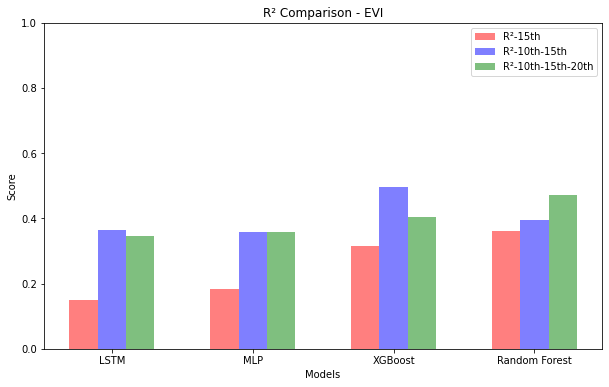

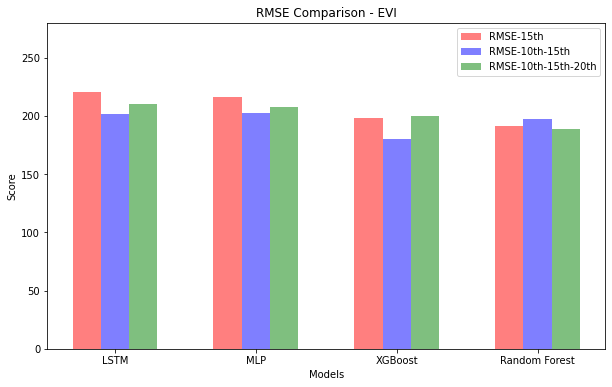

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate performance metrics for each model
r2_scores_evi_15 = [r2_score(y_test_evi, pred_lstm_evi),
                 r2_score(y_test_evi, pred_test_mlp),
                 r2_score(y_test_evi, pred_xgb),
                 r2_score(y_test_evi, rf_pred_test)]

rmse_scores_evi_15 = [np.sqrt(mean_squared_error(y_test_evi, pred_lstm_evi)),
                   np.sqrt(mean_squared_error(y_test_evi, pred_test_mlp)),
                   np.sqrt(mean_squared_error(y_test_evi, pred_xgb)),
                   np.sqrt(mean_squared_error(y_test_evi, rf_pred_test))]


r2_scores_evi_16 = [r2_score(y_test_evi_16, pred_lstm_evi_16),
                 r2_score(y_test_evi_16, pred_test_mlp_16),
                 r2_score(y_test_evi_16, pred_xgb_16),
                 r2_score(y_test_evi_16, rf_pred_test_16)]

rmse_scores_evi_16 = [np.sqrt(mean_squared_error(y_test_evi_16, pred_lstm_evi_16)),
                   np.sqrt(mean_squared_error(y_test_evi_16, pred_test_mlp_16)),
                   np.sqrt(mean_squared_error(y_test_evi_16, pred_xgb_16)),
                   np.sqrt(mean_squared_error(y_test_evi_16, rf_pred_test_16))]

r2_scores_evi_14 = [r2_score(y_test_evi_14, pred_lstm_evi_14),
                 r2_score(y_test_evi_14, pred_test_mlp_14),
                 r2_score(y_test_evi_14, pred_xgb_14),
                 r2_score(y_test_evi_14, rf_pred_test_14)]

rmse_scores_evi_14 = [np.sqrt(mean_squared_error(y_test_evi_14, pred_lstm_evi_14)),
                   np.sqrt(mean_squared_error(y_test_evi_14, pred_test_mlp_14)),
                   np.sqrt(mean_squared_error(y_test_evi_14, pred_xgb_14)),
                   np.sqrt(mean_squared_error(y_test_evi_14, rf_pred_test_14))]

# Model labels
model_labels = ['LSTM', 'MLP', 'XGBoost', 'Random Forest']

# Create bar plots
fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, r2_scores_evi_15, align='center', width=0.2, alpha=0.5, color='red', label='R²-15th')
ax.bar(x_pos, r2_scores_evi_16, align='center', width=0.2, alpha=0.5, color='blue', label='R²-10th-15th')
ax.bar(x_pos+0.2, r2_scores_evi_14, align='center',  width=0.2,alpha=0.5, color='green', label='R²-10th-15th-20th')
ax.set_ylim(0, 1)

ax.set_ylabel('Score')
ax.set_xlabel('Models')
ax.set_title('R² Comparison - EVI')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/r2_evi.png")
plt.show()



fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, rmse_scores_evi_15, align='center',  width=0.2,alpha=0.5, color='red', label='RMSE-15th')
ax.bar(x_pos, rmse_scores_evi_16, align='center', width=0.2, alpha=0.5, color='blue', label='RMSE-10th-15th')
ax.bar(x_pos+0.2, rmse_scores_evi_14, align='center', width=0.2, alpha=0.5, color='green', label='RMSE-10th-15th-20th')


ax.set_ylabel('Score')
ax.set_ylim(0, 280)

ax.set_xlabel('Models')
ax.set_title('RMSE Comparison - EVI')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/rmse_evi.png")
plt.show()


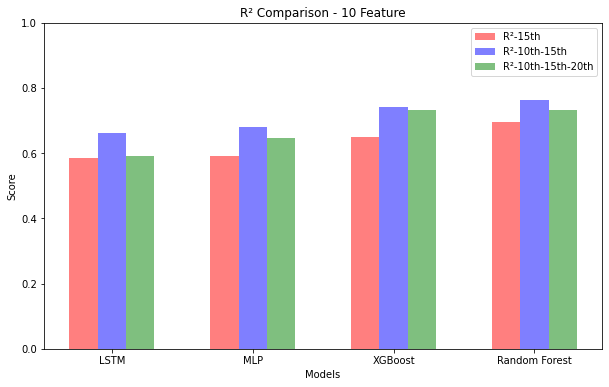

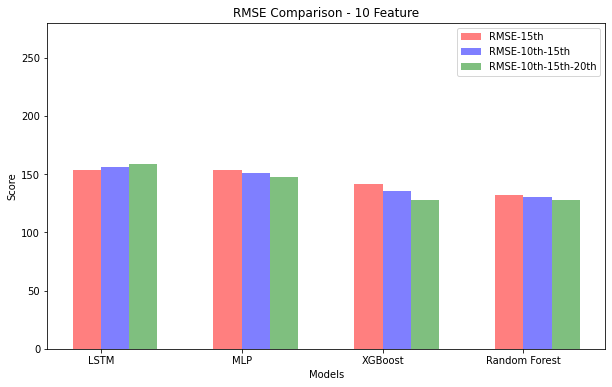

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate performance metrics for each model
r2_scores_full_15 = [r2_score(y_test_full, pred_lstm_full),
                 r2_score(y_test_full, pred_test_mlp_full),
                 r2_score(y_test_full, pred_xgb_full),
                 r2_score(y_test_full, rf_pred_test_full)]

rmse_scores_full_15 = [np.sqrt(mean_squared_error(y_test_full, pred_lstm_full)),
                   np.sqrt(mean_squared_error(y_test_full, pred_test_mlp_full)),
                   np.sqrt(mean_squared_error(y_test_full, pred_xgb_full)),
                   np.sqrt(mean_squared_error(y_test_full, rf_pred_test_full))]


r2_scores_full_16 = [r2_score(y_test_full_16, pred_lstm_full_16),
                 r2_score(y_test_full_16, pred_test_mlp_full_16),
                 r2_score(y_test_full_16, pred_xgb_full_16),
                 r2_score(y_test_full_16, rf_pred_test_full_16)]

rmse_scores_full_16 = [np.sqrt(mean_squared_error(y_test_full_16, pred_lstm_full_16)),
                   np.sqrt(mean_squared_error(y_test_full_16, pred_test_mlp_full_16)),
                   np.sqrt(mean_squared_error(y_test_full_16, pred_xgb_full_16)),
                   np.sqrt(mean_squared_error(y_test_full_16, rf_pred_test_full_16))]

r2_scores_full_14 = [r2_score(y_test_full_14, pred_lstm_full_14),
                 r2_score(y_test_full_14, pred_test_mlp_full_14),
                 r2_score(y_test_full_14, pred_xgb_full_14),
                 r2_score(y_test_full_14, rf_pred_test_full_14)]

rmse_scores_full_14 = [np.sqrt(mean_squared_error(y_test_full_14, pred_lstm_full_14)),
                   np.sqrt(mean_squared_error(y_test_full_14, pred_test_mlp_full_14)),
                   np.sqrt(mean_squared_error(y_test_full_14, pred_xgb_full_14)),
                   np.sqrt(mean_squared_error(y_test_full_14, rf_pred_test_full_14))]
# Model labels
model_labels = ['LSTM', 'MLP', 'XGBoost', 'Random Forest']

# Create bar plots
fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, r2_scores_full_15, align='center',  width=0.2, alpha=0.5, color='red', label='R²-15th')
ax.bar(x_pos, r2_scores_full_16, align='center',  width=0.2, alpha=0.5, color='blue', label='R²-10th-15th')
ax.bar(x_pos+0.2, r2_scores_full_14, align='center',  width=0.2, alpha=0.5, color='green', label='R²-10th-15th-20th')
ax.set_ylim(0, 1)

ax.set_ylabel('Score')
ax.set_xlabel('Models')
ax.set_title('R² Comparison - 10 Feature')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/r2_full.png")
plt.show()

fig, ax = plt.subplots(figsize=(10, 6))

x_pos = np.arange(len(model_labels))

ax.bar(x_pos-0.2, rmse_scores_full_15, align='edge', width=0.2, alpha=0.5, color='red', label='RMSE-15th')
ax.bar(x_pos, rmse_scores_full_16, align='edge', width=0.2, alpha=0.5, color='blue', label='RMSE-10th-15th')
ax.bar(x_pos+0.2, rmse_scores_full_14, align='edge',  width=0.2, alpha=0.5, color='green', label='RMSE-10th-15th-20th')
ax.set_ylim(0, 280)


ax.set_ylabel('Score')
ax.set_xlabel('Models')
ax.set_title('RMSE Comparison - 10 Feature')
ax.set_xticks(x_pos)
ax.set_xticklabels(model_labels)
ax.legend()
plt.savefig("/Users/alperbalmumcu/Github/pickle/Results/rmse_full.png")
plt.show()


In [ ]:
data = {
    'Model': ['LSTM', 'MLP', 'XGB', 'Random Forest'],
    'RMSE (Full 15)': rmse_scores_full_15,
    'RMSE (Full 10)': rmse_scores_full_16,
    'RMSE (Full 20)': rmse_scores_full_14,
    'R2 Score (Full 15)': r2_scores_full_15,
    'R2 Score (Full 10)': r2_scores_full_16,
    'R2 Score (Full 20)': r2_scores_full_14
}

# Create a DataFrame from the data dictionary
df = pd.DataFrame(data)

# Set the 'Model' column as the index
df.set_index('Model', inplace=True)

# Display the table
df.head()

,RMSE (Full 15),RMSE (Full 10),RMSE (Full 20),R2 Score (Full 15),R2 Score (Full 10),R2 Score (Full 20)
Model,,,,,,
LSTM,153.905058,155.795160,158.318356,0.586412,0.660327,0.590960
MLP,153.304831,151.055464,147.282436,0.589631,0.680680,0.645998
XGB,141.586718,135.690695,127.995970,0.649968,0.742337,0.732640
Random Forest,132.408041,130.104721,127.834998,0.693880,0.763114,0.733312


In [ ]:
r2_data_evi = {
    'Model': ['LSTM', 'MLP', 'XGB', 'RF'],
    'R2_15': r2_scores_evi_15,
    'R2_10': r2_scores_evi_16,
    'R2_20': r2_scores_evi_14
}

rmse_data_evi = {
    'Model': ['LSTM', 'MLP', 'XGB', 'RF'],
    'RMSE_15': rmse_scores_evi_15,
    'RMSE_10': rmse_scores_evi_16,
    'RMSE_20': rmse_scores_evi_14
}

# Create DataFrames from the data - evi
r2_df_evi = pd.DataFrame(r2_data_evi)
rmse_df_evi = pd.DataFrame(rmse_data_evi)

In [ ]:
r2_df_evi

,Model,R2_15,R2_10,R2_20
0,LSTM,0.150970,0.365225,0.345426
1,MLP,0.182635,0.359423,0.357031
2,XGB,0.316470,0.494905,0.404741
3,RF,0.361006,0.394108,0.471077


In [ ]:
rmse_df_evi

,Model,RMSE_15,RMSE_10,RMSE_20
0,LSTM,220.511077,201.850881,209.725587
1,MLP,216.359924,202.771191,207.858096
2,XGB,197.855223,180.055876,199.997721
3,RF,191.300904,197.205182,188.524762
